## 以SKCM癌症为例
整个流程主要包含以下几个流程：
1. 统一peak，重新生成 peak x cell 矩阵
1. merge所有样本，生成一个样本对象，重新运行配对多组学的Seurat/Siganc流程
1. 使用cell的marker，简单注释细胞（为了后续fastCNV设置参考细胞）
1. 使用fastCNV确定癌症细胞
1. 提取正常细胞，重新运行配对多组学的Seurat/Siganc流程，对细胞进行注释
1. 将正常的细胞映射回原数据，其他细胞标为Tumor

注意：最好事先把属于一个癌症的样本放在一个目录下面

In [1]:
library(Seurat)
library(ggplot2)
library(patchwork)
library(dplyr)
library(Signac)
library(GenomicRanges)
library(GenomeInfoDb)
library(EnsDb.Hsapiens.v86)

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: stats4

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union


The following object is masked from ‘package:SeuratObject’:

    intersect


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, intersect, is.unsorted, lapply, 

In [ ]:
files <- list.files("/mnt/netshare2/miaoyuanyuan/work/3_Cancer/1_cancer11/2_seurat_filt/SKCM")

In [ ]:
setwd("/mnt/netshare2/miaoyuanyuan/work/3_Cancer/1_cancer11/2_seurat_filt/SKCM")

### 统一peak，重新生成 peak x cell 矩阵

In [ ]:
files<-files[-length(files)]

In [ ]:
data_list <- setNames(lapply(files, readRDS),
                      gsub(".rds", "", files))

In [ ]:
data_list 

In [ ]:
data_list <- lapply(data_list, function(x) {
  DefaultAssay(x) <- "peaks"
  return(x)
})

In [ ]:
combined.peaks <- UnifyPeaks(object.list = data_list,mode = "reduce")

In [ ]:
peakwidths <- width(combined.peaks)
combined.peaks <- combined.peaks[peakwidths  < 10000 & peakwidths > 20]

In [ ]:
count.list <- lapply(data_list, function(obj) {
  obj@assays[["peaks"]]@fragments[[1]]@path=obj@assays[["ATAC"]]@fragments[[1]]@path
  FeatureMatrix(
    fragments = Fragments(obj),
    features = combined.peaks,
    cells = colnames(obj)
  )
})

In [ ]:
annotation <- GetGRangesFromEnsDb(ensdb = EnsDb.Hsapiens.v86)
seqlevels(annotation) <- paste0("chr", seqlevels(annotation))

In [ ]:
names(count.list) <- names(data_list)
obj.list <- mapply(function(obj, counts) {
  obj[["peaks"]] <- CreateChromatinAssay(
    counts = counts,
    fragments = Fragments(obj),
    sep = c(":", "-"),  
    annotation = annotation  
  )
  obj@assays[["peaks"]]@fragments[[1]]@path=obj@assays[["ATAC"]]@fragments[[1]]@path  
  obj
}, data_list, count.list, SIMPLIFY = FALSE)

In [ ]:
sample_ids <- gsub(".rds", "", files)
sample_ids

### merge所有样本

In [ ]:
for (i in seq_along(obj.list)) {
  obj.list[[i]] <- RenameCells(obj.list[[i]], new.names = paste0(sample_ids[i], "_", colnames(obj.list[[i]])))
}
cancer <- merge(obj.list[[1]], y = obj.list[-1])

In [ ]:
cancer <- merge(obj.list[[1]], y = obj.list[-1])

In [ ]:
cancer$sample <- as.character(gsub("-", "_",unlist(mapply(function(obj, id) {
  rep(id, ncol(obj))
}, obj.list, sample_ids))))

In [ ]:
sample_ids[c(9,12,15,20,21)]

In [ ]:
cancer_type<-c(rep("Met",length(sample_ids)))
cancer_type[c(9,12,15,20,21)]<-"Tumor"     
cancer$type<-as.character(gsub("-", "_",unlist(mapply(function(obj, id) {
  rep(id, ncol(obj))
}, obj.list, cancer_type))))

In [ ]:
cancer <- SCTransform(cancer,vars.to.regress = c("nCount_RNA", 
                                                 "percent.mt"), return.only.var.genes = F)
cancer <- RunPCA(cancer)

In [ ]:
DefaultAssay(cancer) <- "peaks"
cancer <- FindTopFeatures(cancer, min.cutoff = 5)
cancer <- RunTFIDF(cancer)
cancer<- RunSVD(cancer)

In [4]:
SKCM <- FindMultiModalNeighbors(
  object = SKCM,
  reduction.list = list("pca", "lsi"), 
  dims.list = list(1:30, 2:30),
  modality.weight.name = "RNA.weight",
  verbose = TRUE
)
SKCM <- RunUMAP(
  object = SKCM,
  nn.name = "weighted.nn",
    reduction.name = "wnn.umap", # 起了个新名字
  reduction.key = "wnnHUMAP_",
  verbose = TRUE
)

Calculating cell-specific modality weights

Finding 20 nearest neighbors for each modality.

Calculating kernel bandwidths

Warning message in FindMultiModalNeighbors(object = SKCM, reduction.list = list("pca", :
"The number of provided modality.weight.name is not equal to the number of modalities. SCT.weight peaks.weight are used to store the modality weights"
Finding multimodal neighbors

Constructing multimodal KNN graph

Constructing multimodal SNN graph

Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"
16:57:44 UMAP embedding parameters a = 0.9922 b = 1.112

16:57:48 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 20

16:57:55 Initializing from normalized Laplacian + noise (using RSpectra)

16:58:00 Commencing o

In [5]:
SKCM <- FindClusters(
  SKCM, 
  graph.name = "wsnn", # wsnn 是 FindMultiModalNeighbors 默认生成的联合图名称
  algorithm = 3,       # 匹配文献：3 代表 SLM 算法, algorithm = 4 是 Leiden。
  resolution = 0.1,
  verbose = FALSE
)

Warning message:
"`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation idioms with `aes()`.
ℹ See also `vignette("ggplot2-in-packages")` for more information.
ℹ The deprecated feature was likely used in the Seurat package.
  Please report the issue at <https://github.com/satijalab/seurat/issues>."


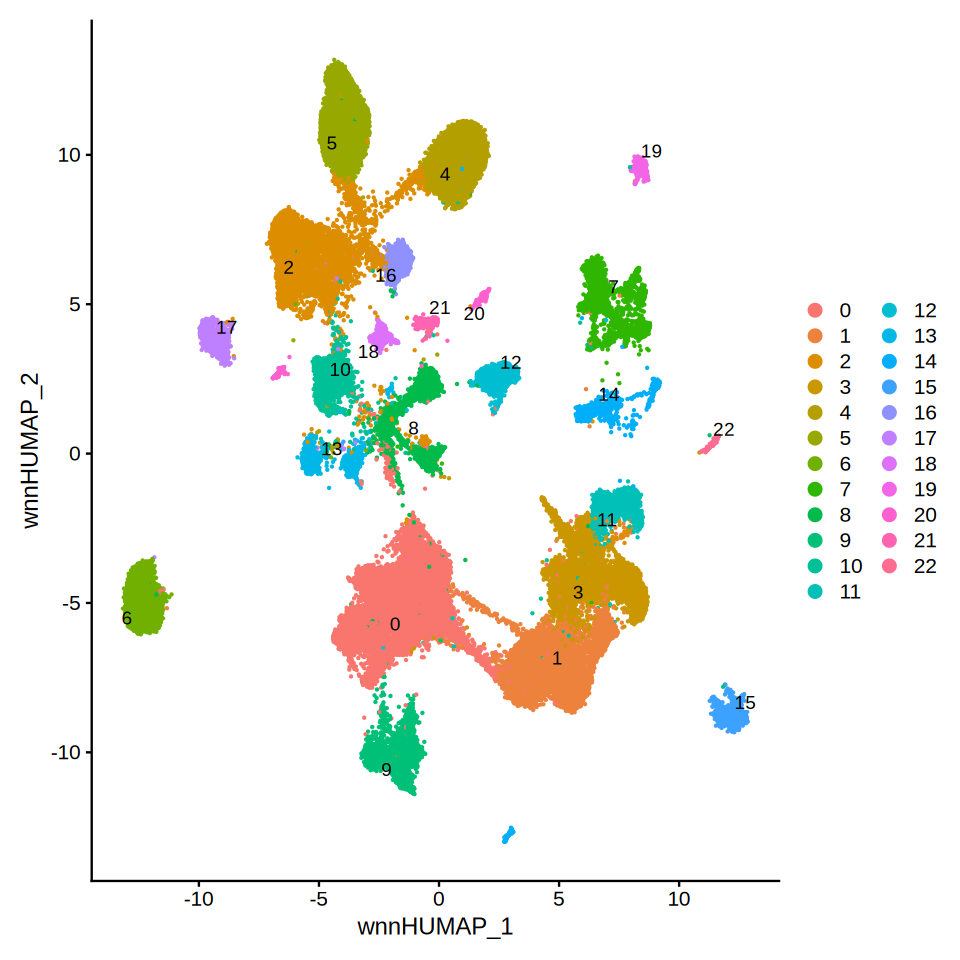

In [6]:
options(repr.plot.width = 8, repr.plot.height = 8)
DimPlot(SKCM, label = TRUE, repel = TRUE, reduction = "wnn.umap")

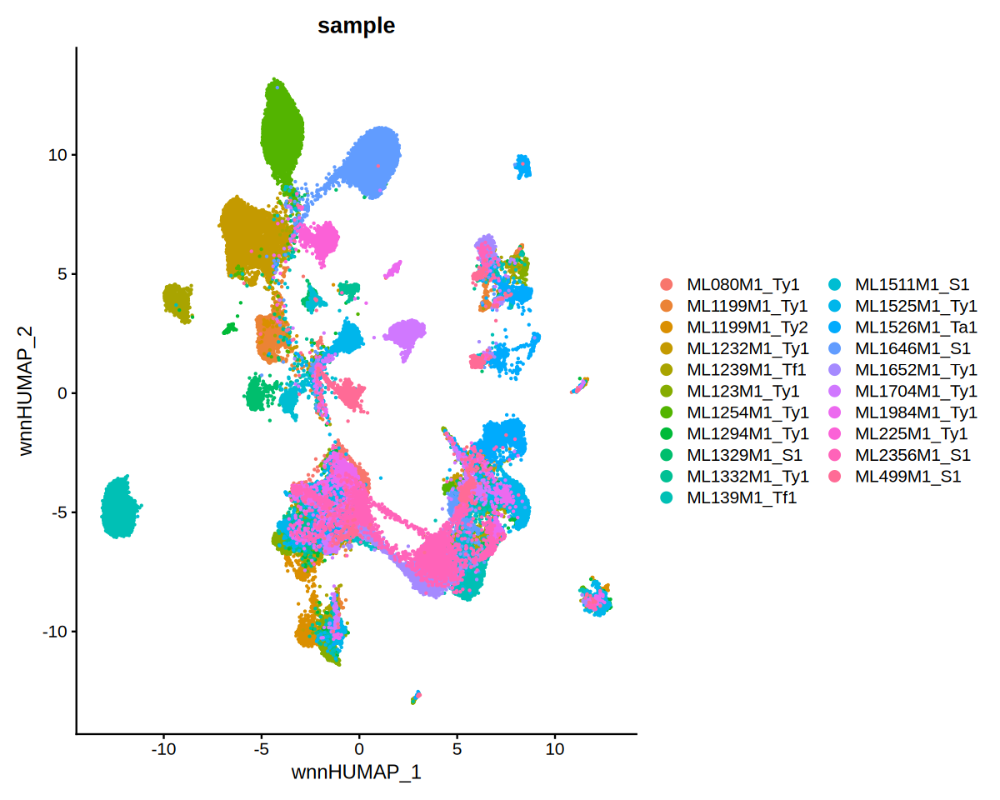

In [10]:
options(repr.plot.width = 10, repr.plot.height = 8)
DimPlot(SKCM, reduction = "wnn.umap", group.by = "sample") 

In [12]:
SKCM <- FindClusters(
  SKCM, 
  graph.name = "wsnn", # wsnn 是 FindMultiModalNeighbors 默认生成的联合图名称
  algorithm = 3,       # 匹配文献：3 代表 SLM 算法, algorithm = 4 是 Leiden。
  resolution = 0.5,
  verbose = FALSE
)

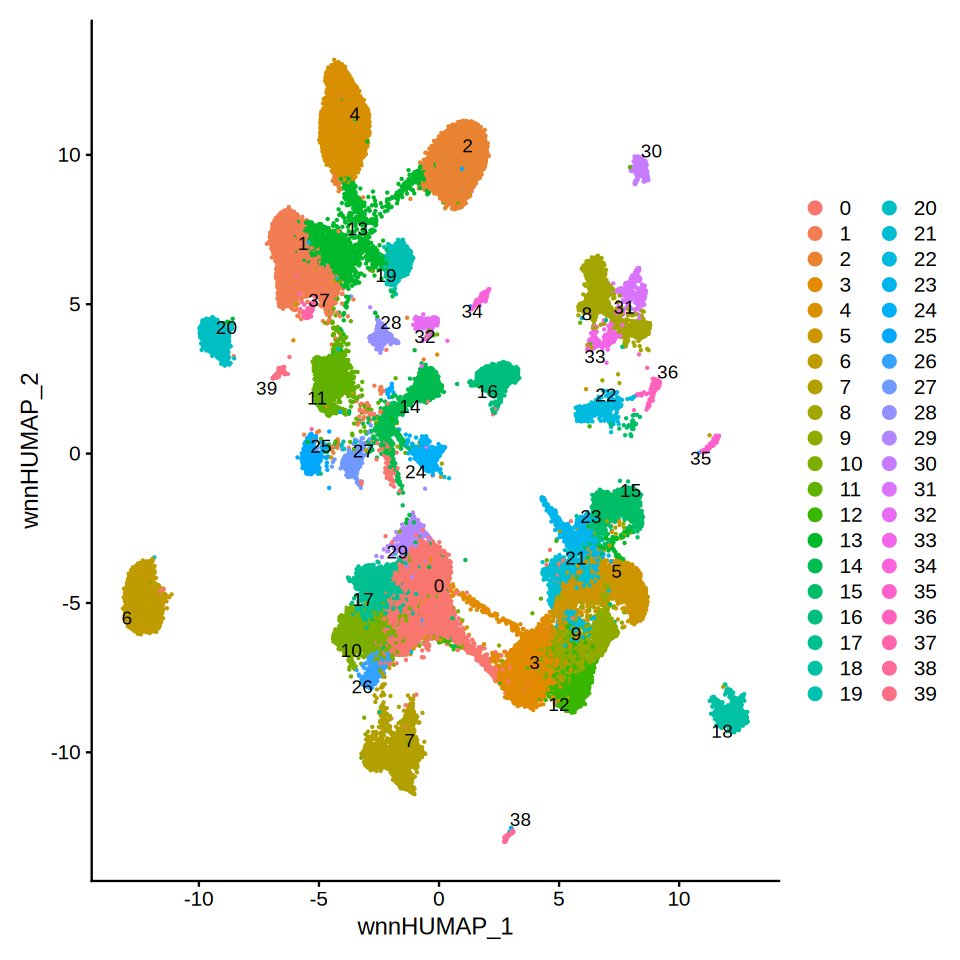

In [13]:
options(repr.plot.width = 8, repr.plot.height = 8)
DimPlot(SKCM, label = TRUE, repel = TRUE, reduction = "wnn.umap")

### cell的marker，简单注释细胞

In [7]:
marker_gene<-read.csv("/mnt/netshare2/liangxuan/data/cancer/Marker.csv",header=T)
head(marker_gene)

,Gene_set_group,Gene_set,Gene
,<chr>,<chr>,<chr>
1,Immune,B-cells,CD19
2,Immune,B-cells,CD79A
3,Immune,B-cells,CD79B
4,Immune,B-cells,CD83
5,Immune,B-cells,CD86
6,Immune,B-cells,MS4A1


In [8]:
SKCM_marker<-unique(marker_gene$Gene[marker_gene$Gene_set%in%c("B-cells","Endothelial","Fibroblasts","cDC1","cDC2","pDC","Keratinocytes","Macrophages","Mast","Plasma cells","T cells","vSMCs")])

Warning message:
"Could not find MRGPRX2 in the default search locations, found in 'RNA' assay instead"
Warning message:
"No layers found matching search pattern provided"
Warning message in FetchData.Assay5(object = object[[assay]], vars = keyed.var, :
"data layer is not found and counts layer is used"
Warning message:
"Could not find TPSAB1 in the default search locations, found in 'RNA' assay instead"
Warning message:
"No layers found matching search pattern provided"
Warning message in FetchData.Assay5(object = object[[assay]], vars = keyed.var, :
"data layer is not found and counts layer is used"
Warning message:
"Could not find IGHE in the default search locations, found in 'RNA' assay instead"
Warning message:
"No layers found matching search pattern provided"
Warning message in FetchData.Assay5(object = object[[assay]], vars = keyed.var, :
"data layer is not found and counts layer is used"
Warning message:
"The following requested variables were not found: CD138"


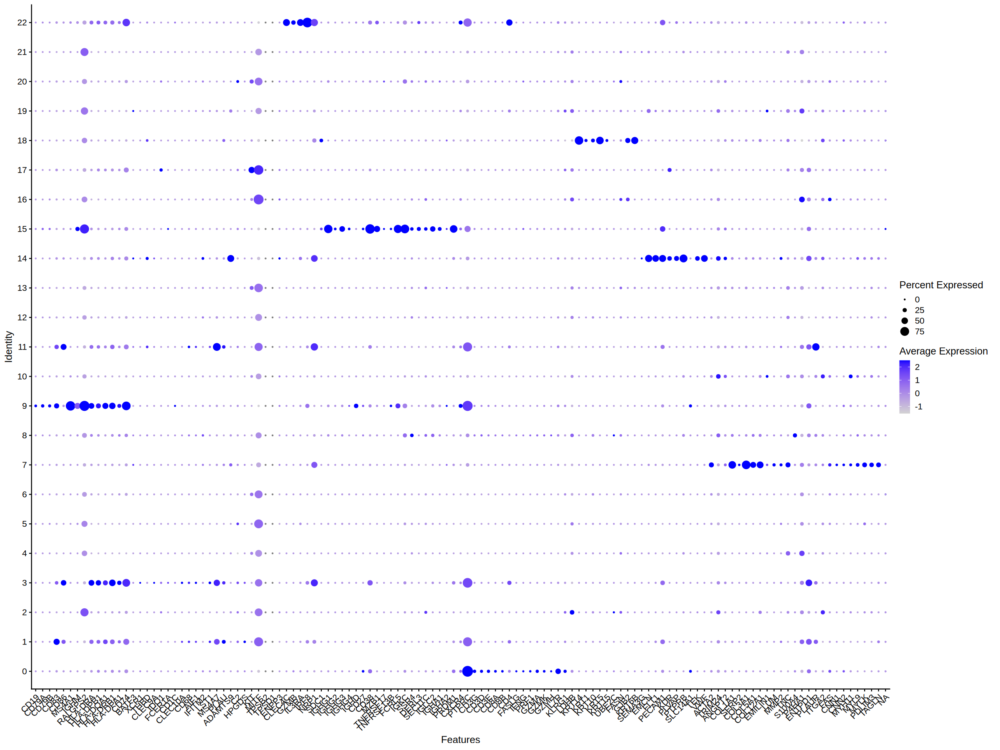

In [9]:
options(repr.plot.width = 20, repr.plot.height = 15)
DefaultAssay(SKCM) <- "SCT"
DotPlot(SKCM, features = SKCM_marker) + RotatedAxis()

### fastCNV，进一步确认癌症细胞还是正常细胞

In [12]:
library(fastCNV)

Warning message:
"replacing previous import 'dplyr::lag' by 'stats::lag' when loading 'fastCNV'"
Warning message:
"replacing previous import 'dplyr::filter' by 'stats::filter' when loading 'fastCNV'"
Warning message:
"replacing previous import 'stats::as.dist' by 'proxy::as.dist' when loading 'fastCNV'"
Warning message:
"replacing previous import 'stats::dist' by 'proxy::dist' when loading 'fastCNV'"


In [13]:
DefaultAssay(SKCM) <- "RNA"
obj.list <- SplitObject(SKCM, split.by = "sample")
obj.list

$ML080M1_Ty1
An object of class Seurat 
784734 features across 1503 samples within 4 assays 
Active assay: RNA (36601 features, 0 variable features)
 1 layer present: counts.1
 3 other assays present: ATAC, peaks, SCT
 3 dimensional reductions calculated: pca, lsi, wnn.umap

$ML1199M1_Ty1
An object of class Seurat 
784734 features across 2755 samples within 4 assays 
Active assay: RNA (36601 features, 0 variable features)
 1 layer present: counts.2
 3 other assays present: ATAC, peaks, SCT
 3 dimensional reductions calculated: pca, lsi, wnn.umap

$ML1199M1_Ty2
An object of class Seurat 
784734 features across 2884 samples within 4 assays 
Active assay: RNA (36601 features, 0 variable features)
 1 layer present: counts.3
 3 other assays present: ATAC, peaks, SCT
 3 dimensional reductions calculated: pca, lsi, wnn.umap

$ML1232M1_Ty1
An object of class Seurat 
784734 features across 7212 samples within 4 assays 
Active assay: RNA (36601 features, 0 variable features)
 1 layer present: co

[2026-03-23 20:00:54] Aggregating counts matrix...

Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 2.0 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.1 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.4 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.7 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.4 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.2 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.6 GiB"
Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 1.2 GiB"
[2026-03-23 20:05:23] Done !

[2026-03-23 20:05:23] Running CNV analysis...

Warning message in asMethod(object):
"sparse->dense coercion: allocating vector of size 2.0 GiB

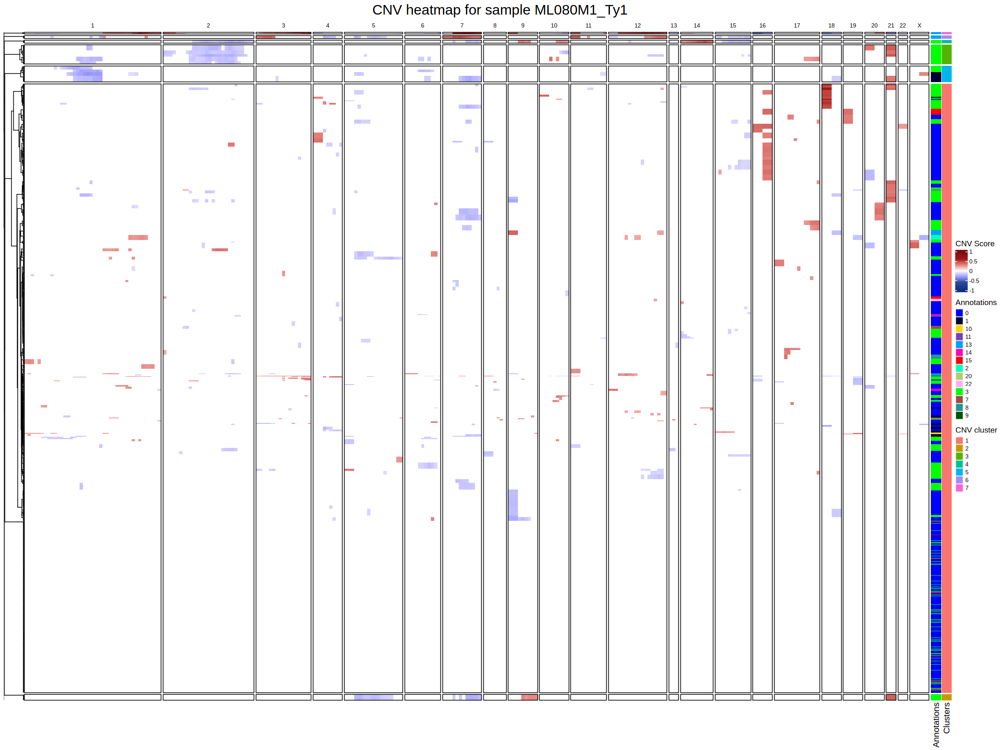

CNV plot for sample ML1199M1_Ty1 saved at ./heatmap.fastCNV_ML1199M1_Ty1.png



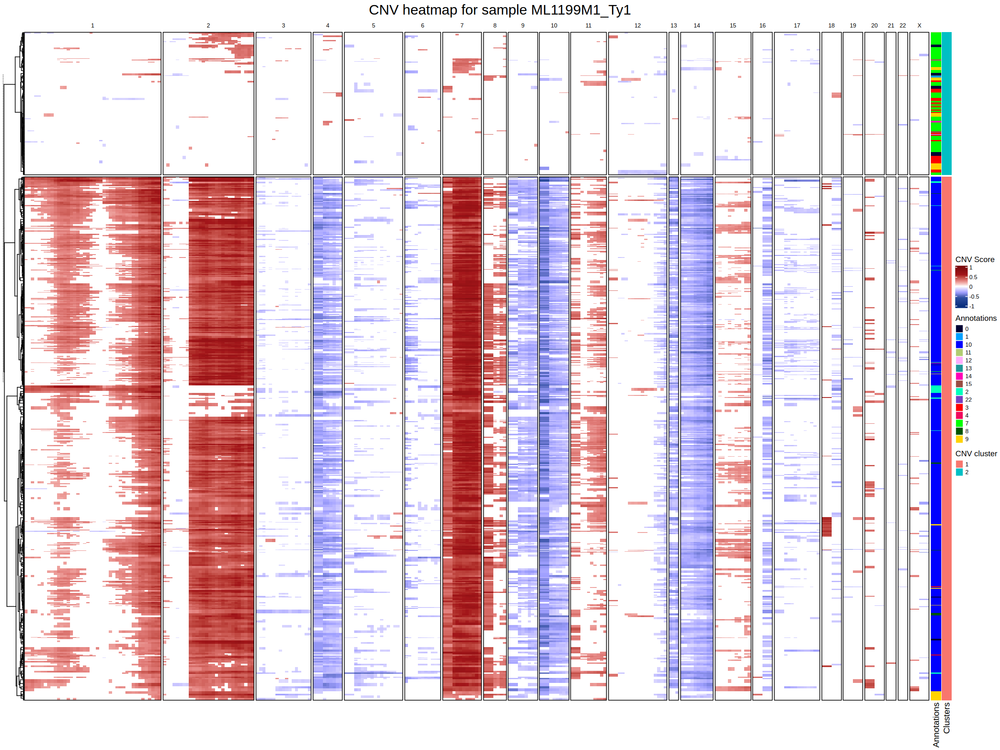

CNV plot for sample ML1199M1_Ty2 saved at ./heatmap.fastCNV_ML1199M1_Ty2.png



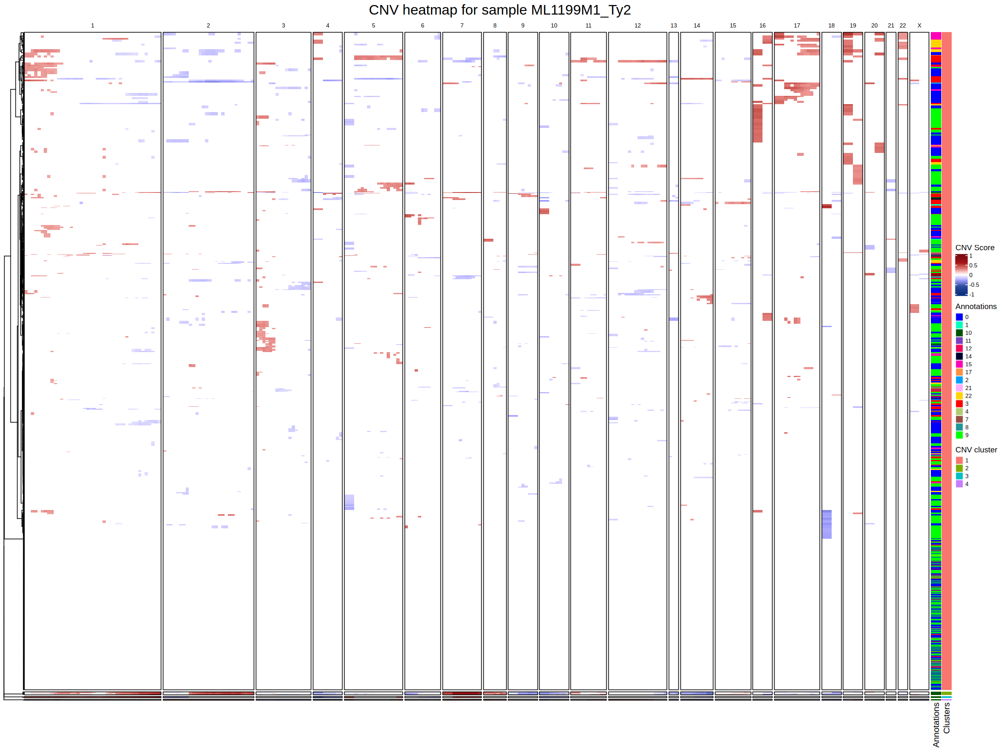

CNV plot for sample ML1232M1_Ty1 saved at ./heatmap.fastCNV_ML1232M1_Ty1.png



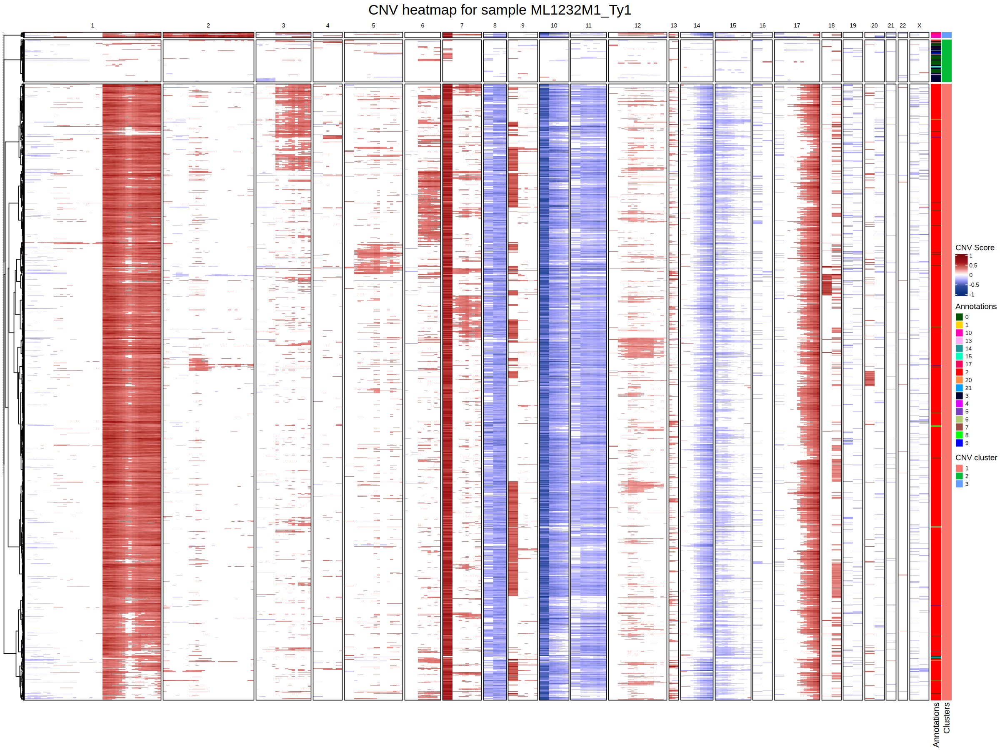

CNV plot for sample ML1239M1_Tf1 saved at ./heatmap.fastCNV_ML1239M1_Tf1.png



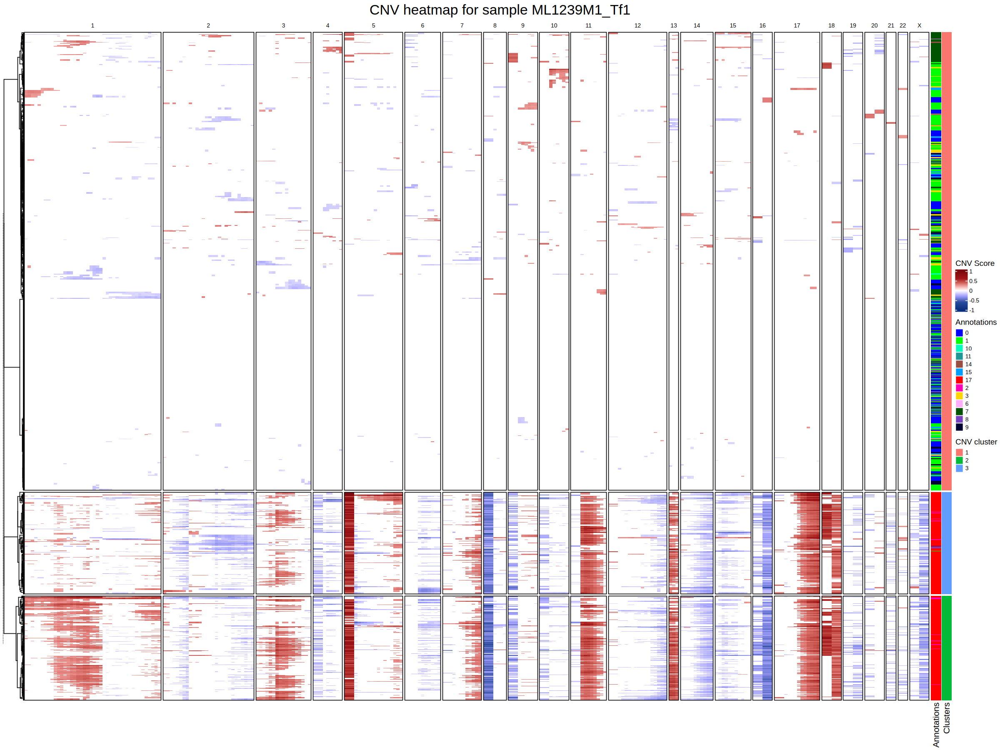

CNV plot for sample ML123M1_Ty1 saved at ./heatmap.fastCNV_ML123M1_Ty1.png



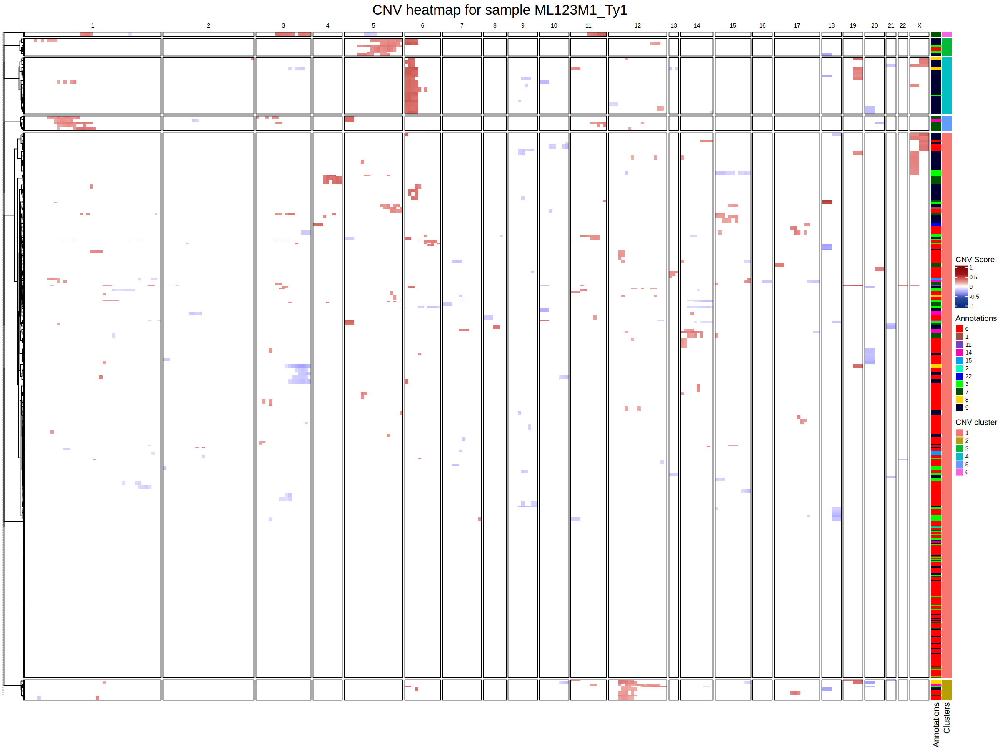

CNV plot for sample ML1254M1_Ty1 saved at ./heatmap.fastCNV_ML1254M1_Ty1.png



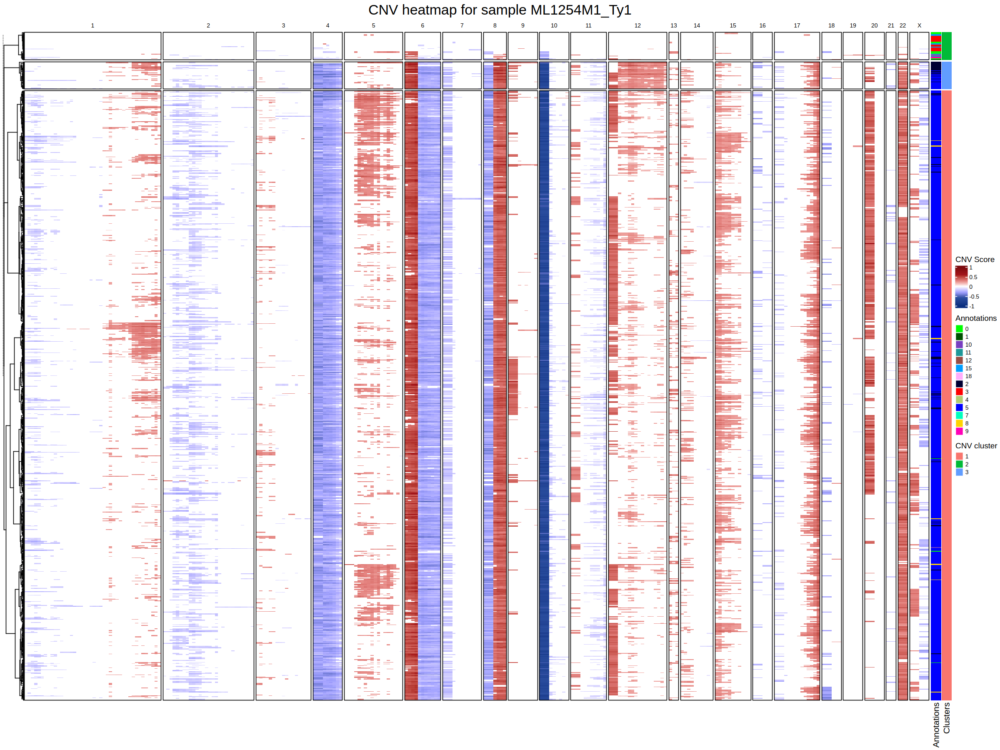

CNV plot for sample ML1294M1_Ty1 saved at ./heatmap.fastCNV_ML1294M1_Ty1.png



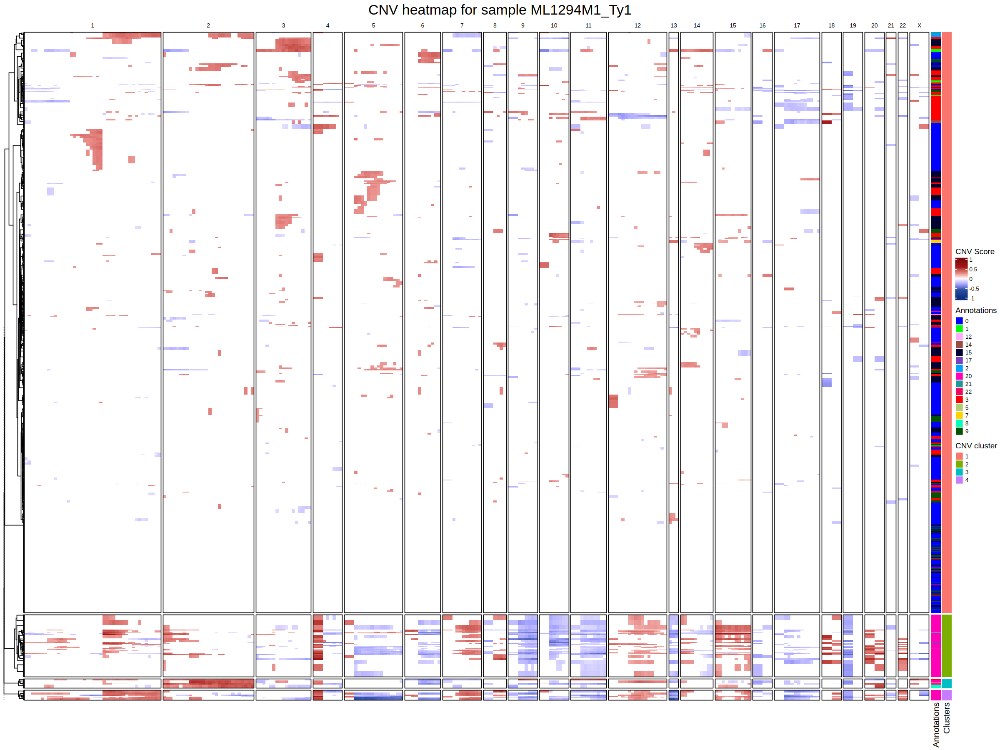

CNV plot for sample ML1329M1_S1 saved at ./heatmap.fastCNV_ML1329M1_S1.png



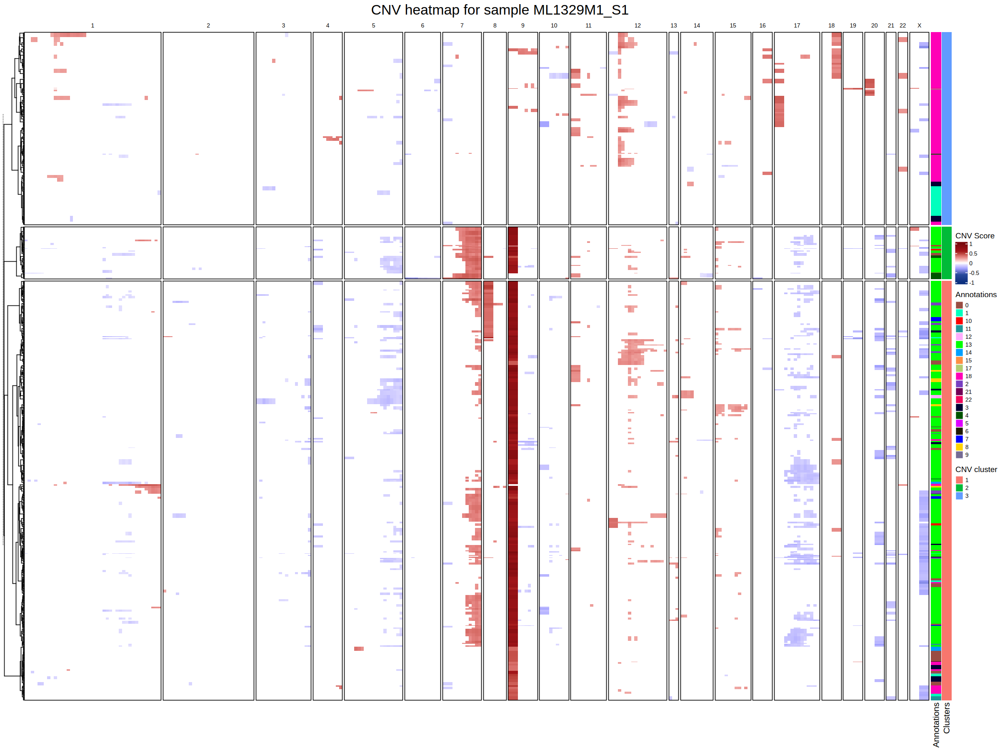

CNV plot for sample ML1332M1_Ty1 saved at ./heatmap.fastCNV_ML1332M1_Ty1.png



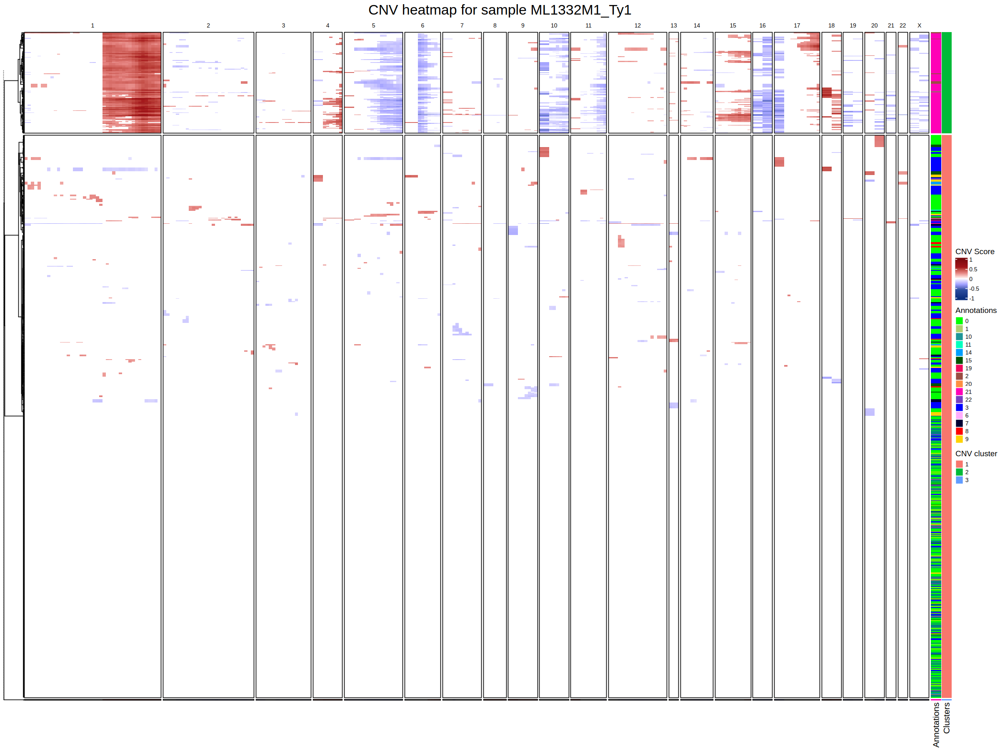

CNV plot for sample ML139M1_Tf1 saved at ./heatmap.fastCNV_ML139M1_Tf1.png



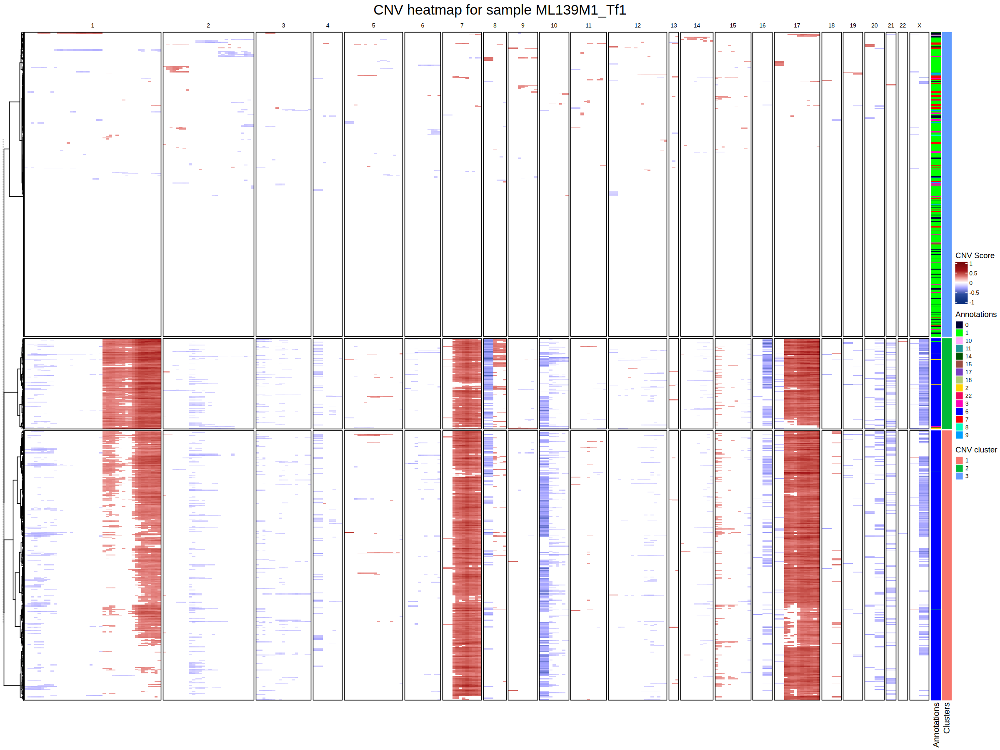

CNV plot for sample ML1511M1_S1 saved at ./heatmap.fastCNV_ML1511M1_S1.png



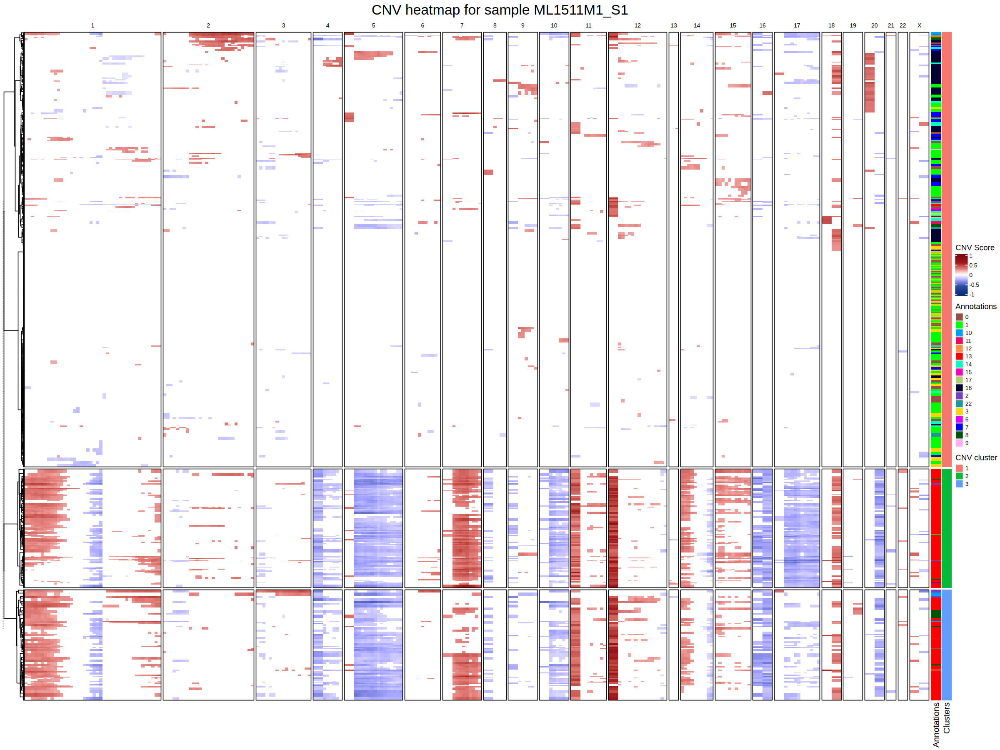

CNV plot for sample ML1525M1_Ty1 saved at ./heatmap.fastCNV_ML1525M1_Ty1.png



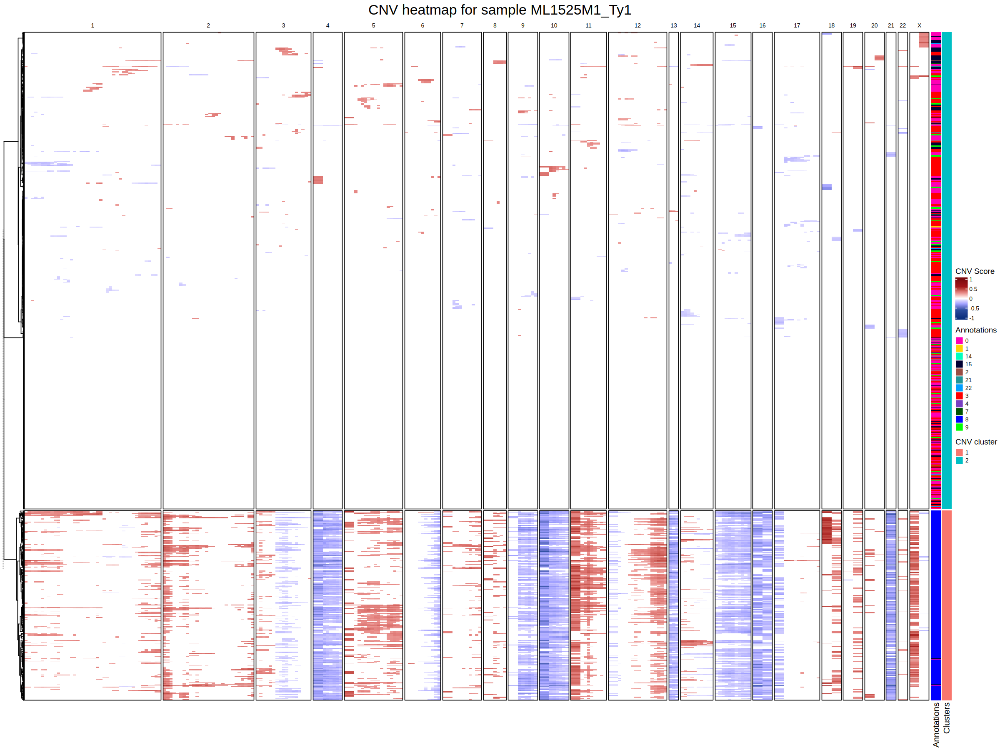

CNV plot for sample ML1526M1_Ta1 saved at ./heatmap.fastCNV_ML1526M1_Ta1.png



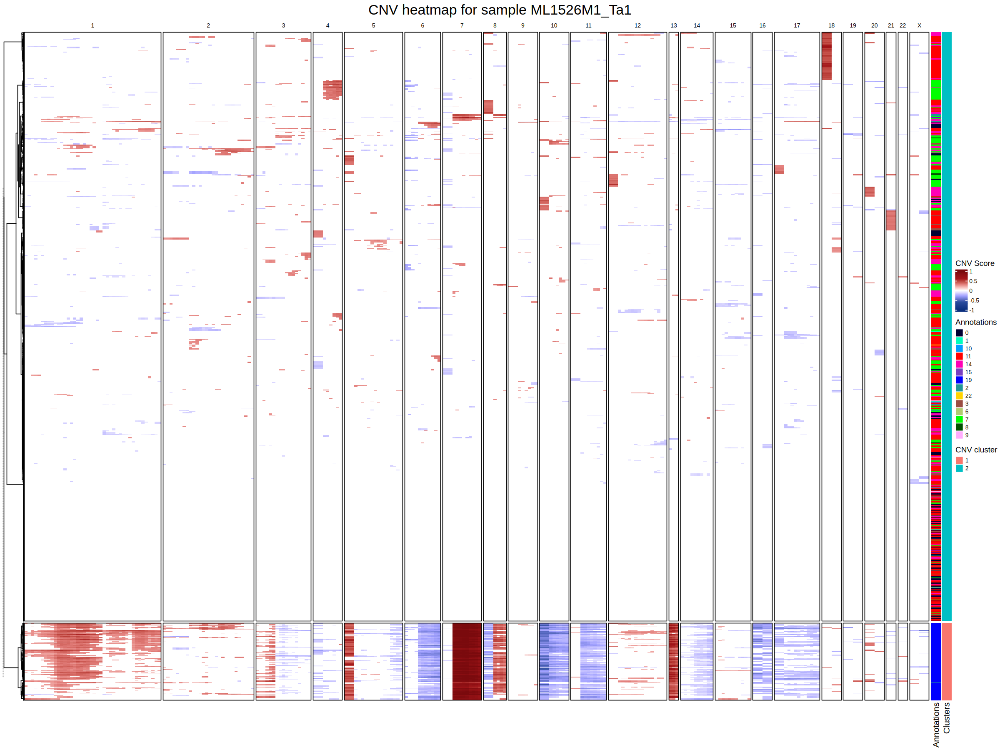

CNV plot for sample ML1646M1_S1 saved at ./heatmap.fastCNV_ML1646M1_S1.png



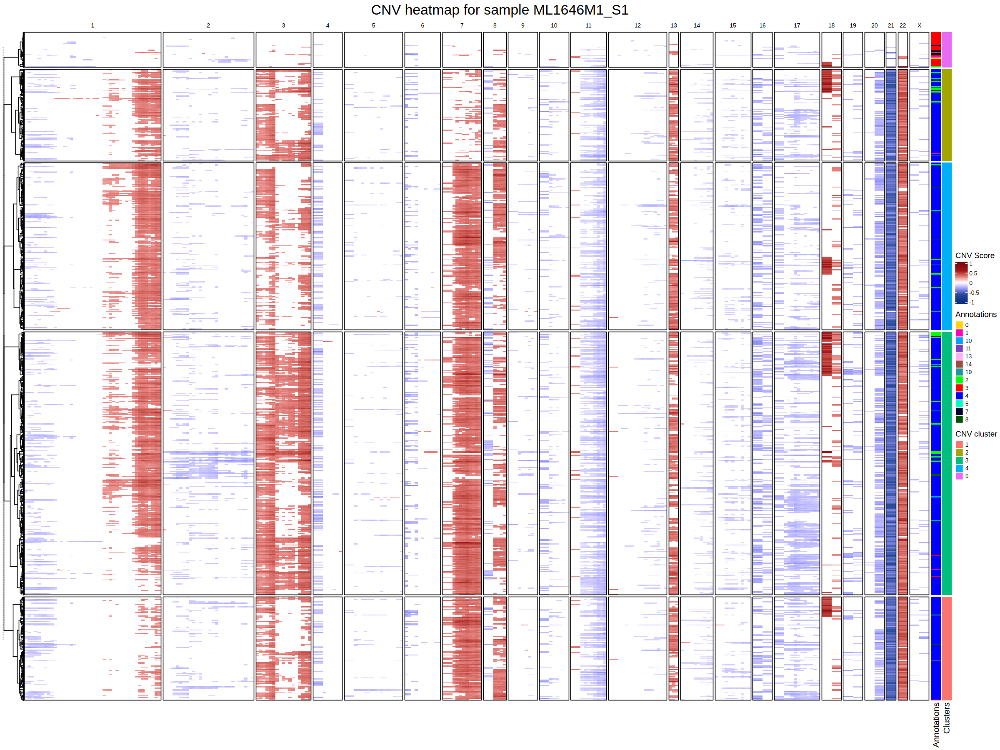

CNV plot for sample ML1652M1_Ty1 saved at ./heatmap.fastCNV_ML1652M1_Ty1.png



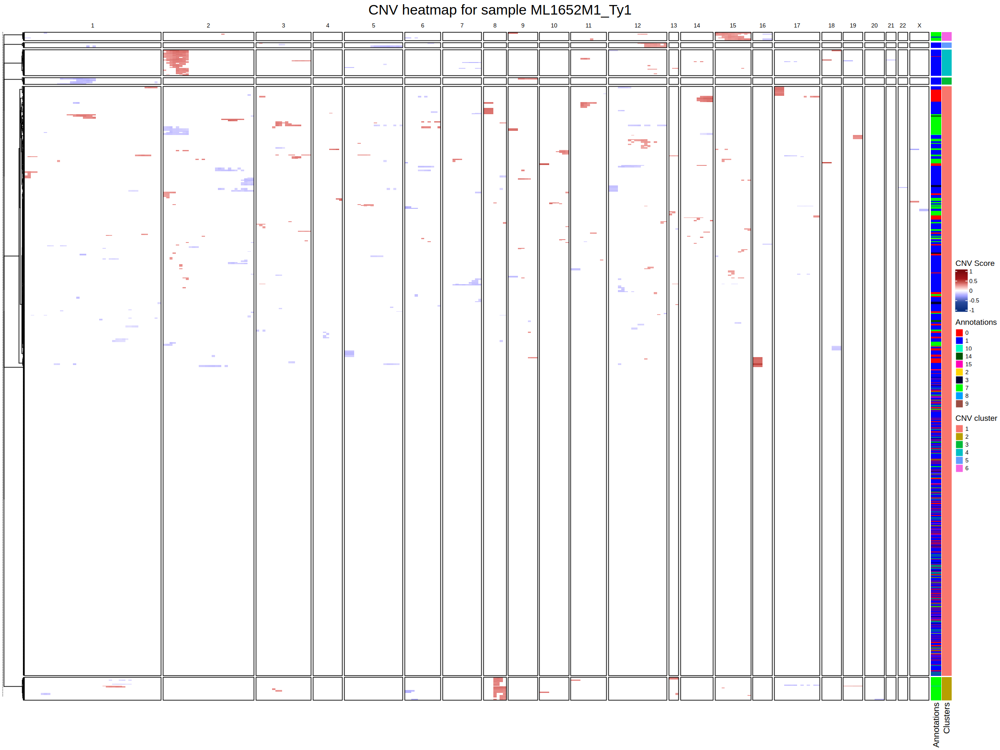

CNV plot for sample ML1704M1_Ty1 saved at ./heatmap.fastCNV_ML1704M1_Ty1.png



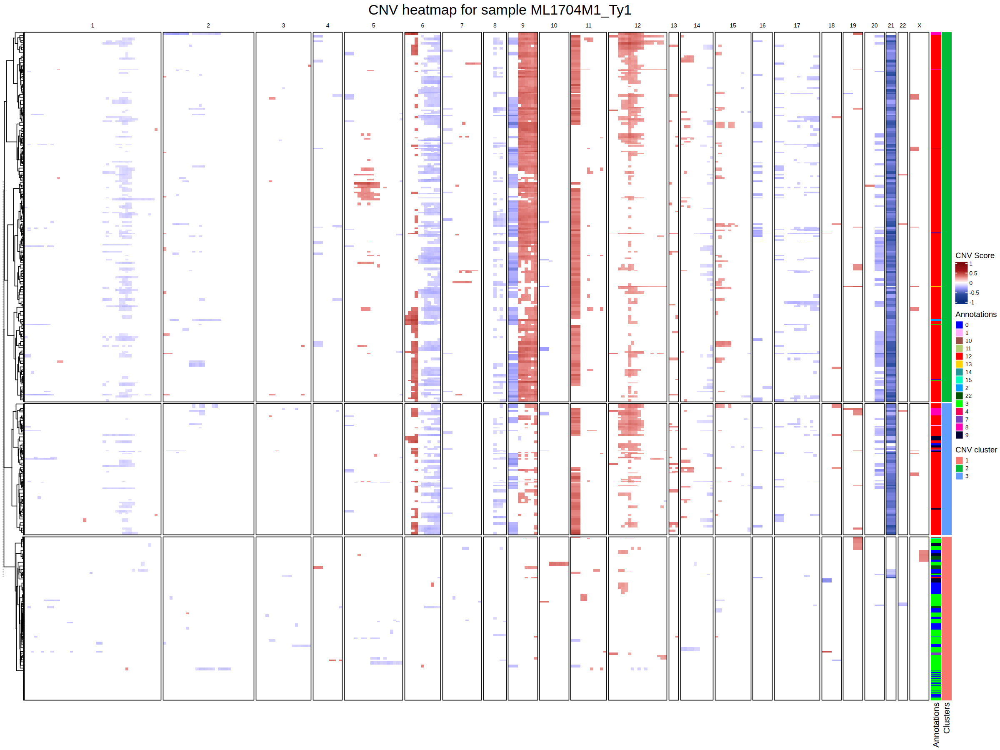

CNV plot for sample ML1984M1_Ty1 saved at ./heatmap.fastCNV_ML1984M1_Ty1.png



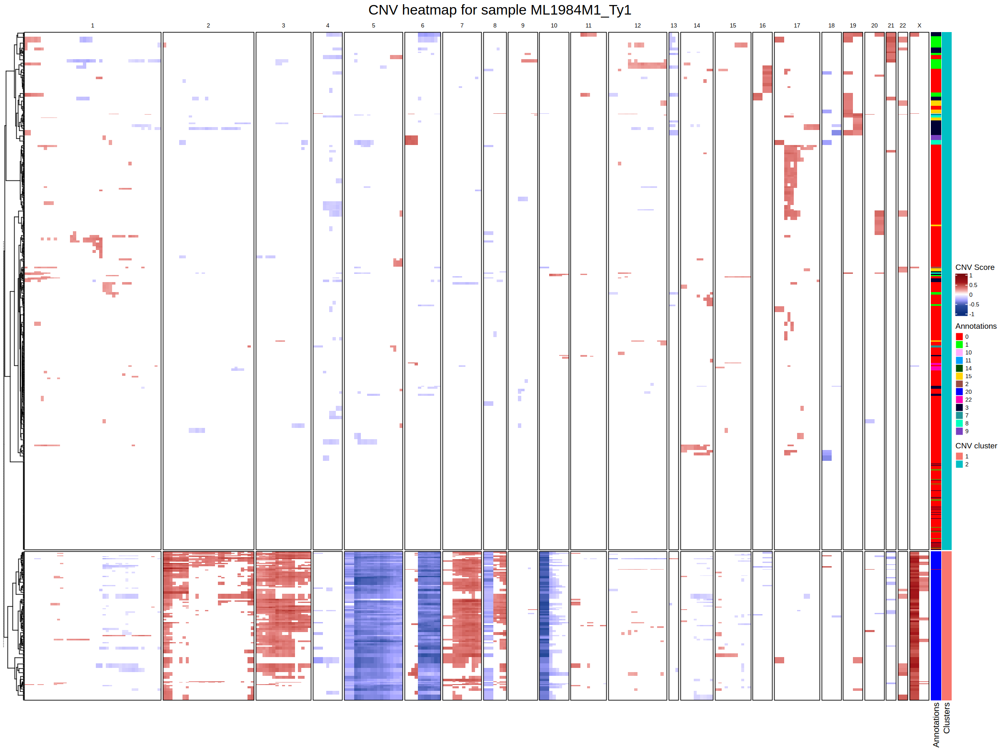

CNV plot for sample ML225M1_Ty1 saved at ./heatmap.fastCNV_ML225M1_Ty1.png



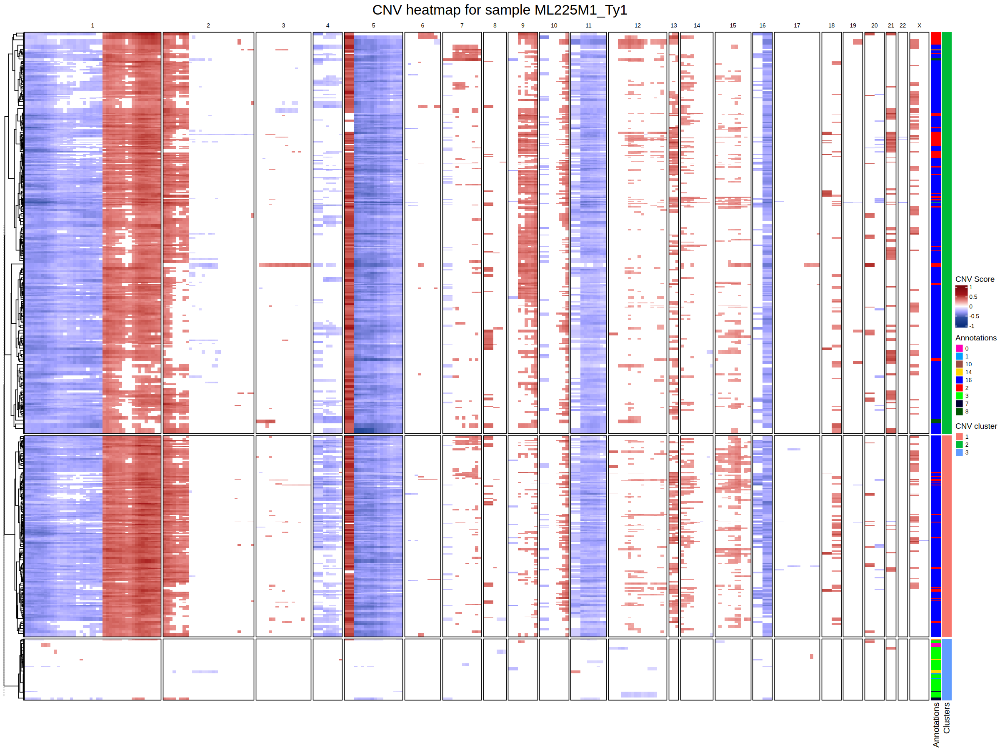

CNV plot for sample ML2356M1_S1 saved at ./heatmap.fastCNV_ML2356M1_S1.png



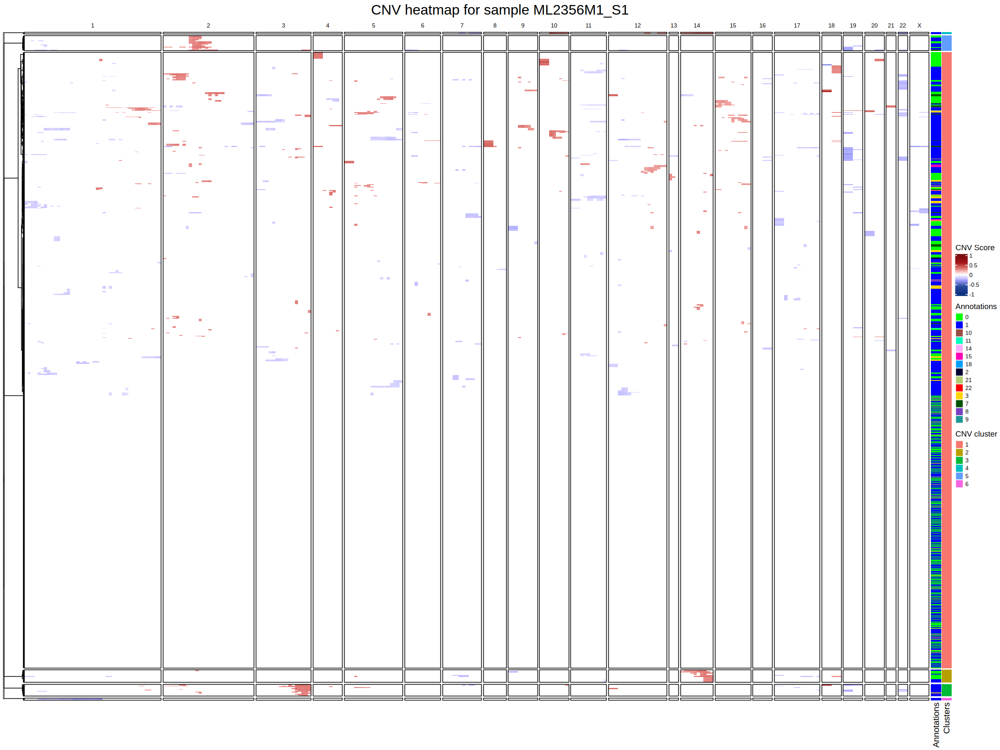

CNV plot for sample ML499M1_S1 saved at ./heatmap.fastCNV_ML499M1_S1.png

[2026-03-23 20:53:59] Done !



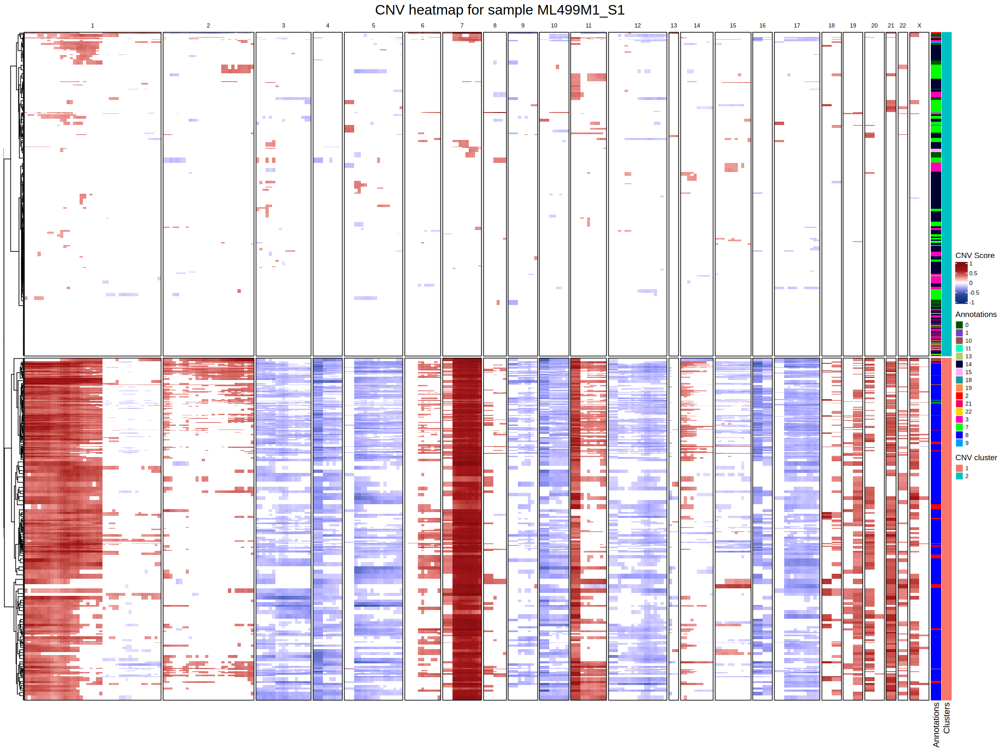

In [ ]:
sampleNames <-names(obj.list)
referencelabels <- c("0", "1", "3","7","9","14","15","22") #设置正常的参考细胞
obj.list <- fastCNV(obj.list, sampleNames, referenceVar = "wsnn_res.0.1", 
                      referenceLabel = referencelabels, printPlot = T)

Warning message:
"The `slot` argument of `FetchData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead.
ℹ The deprecated feature was likely used in the Seurat package.
  Please report the issue at <https://github.com/satijalab/seurat/issues>."


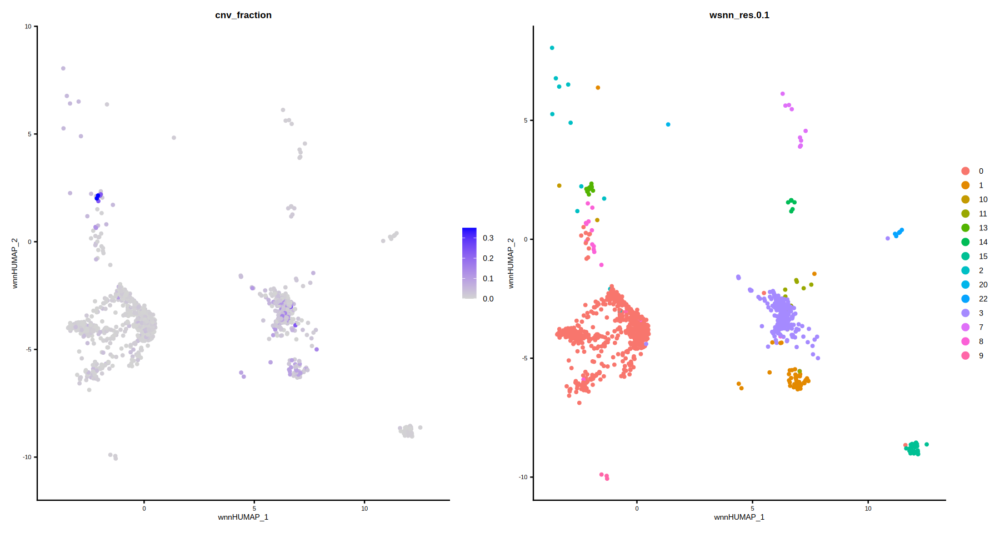

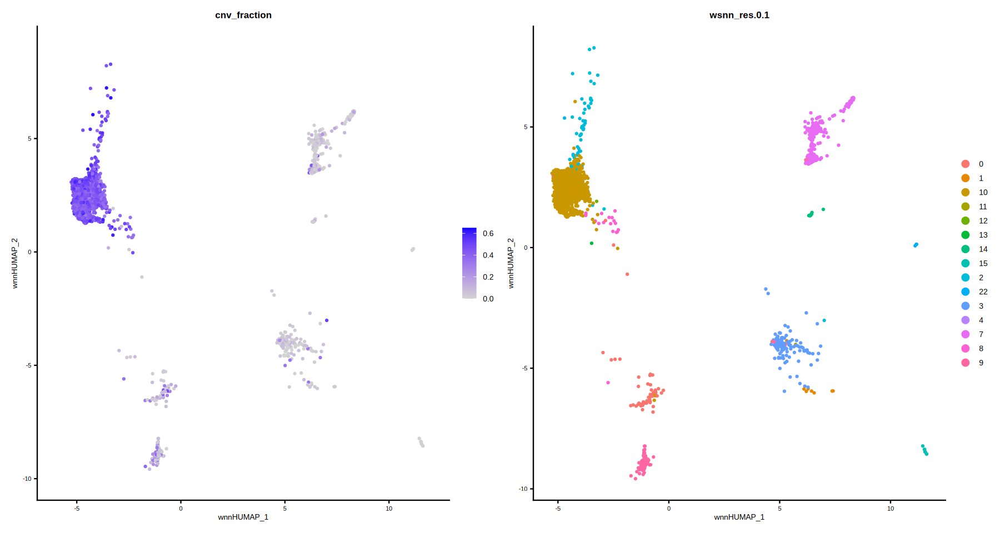

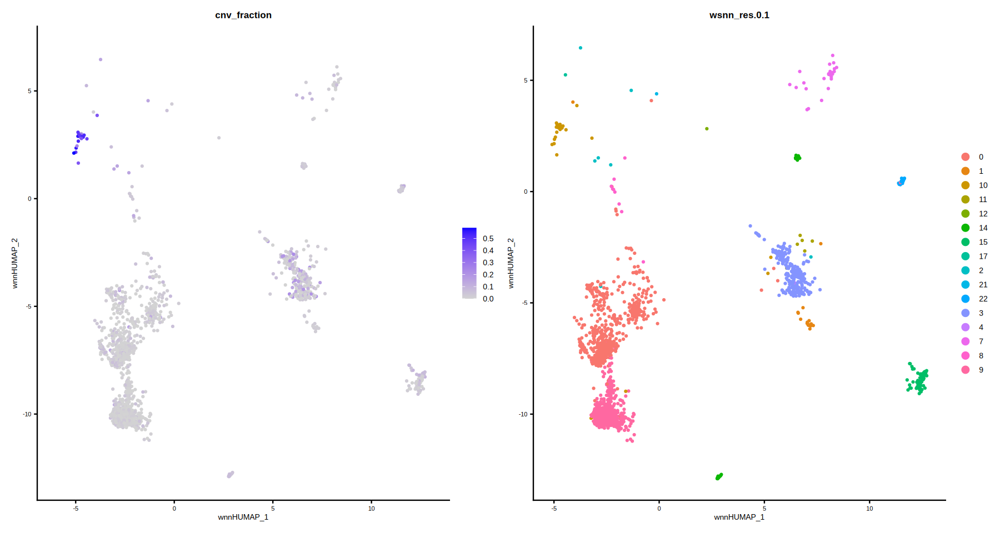

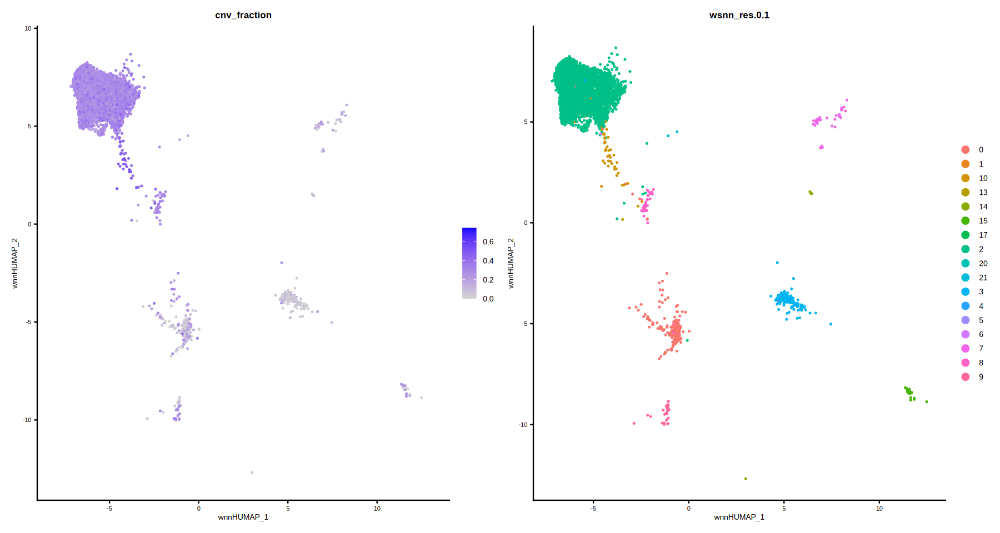

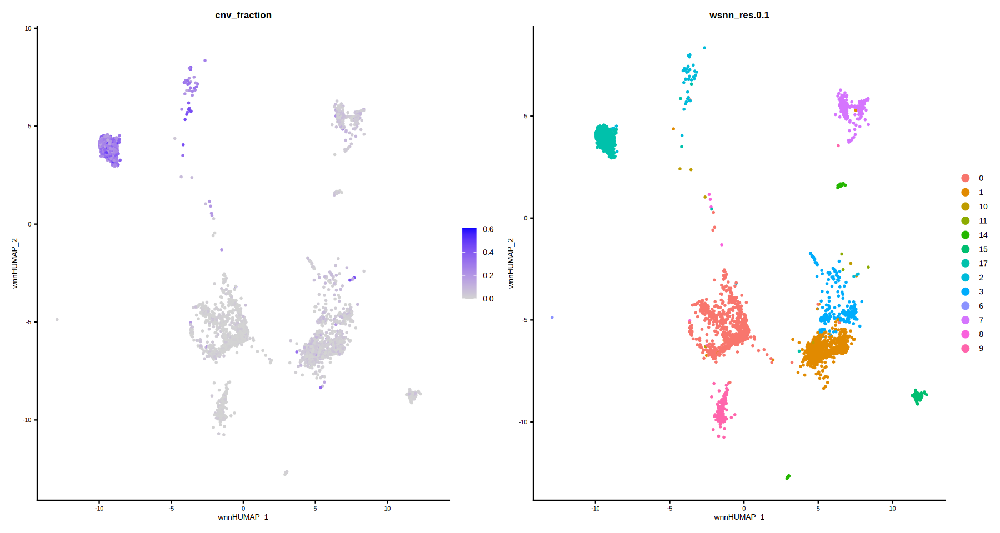

...

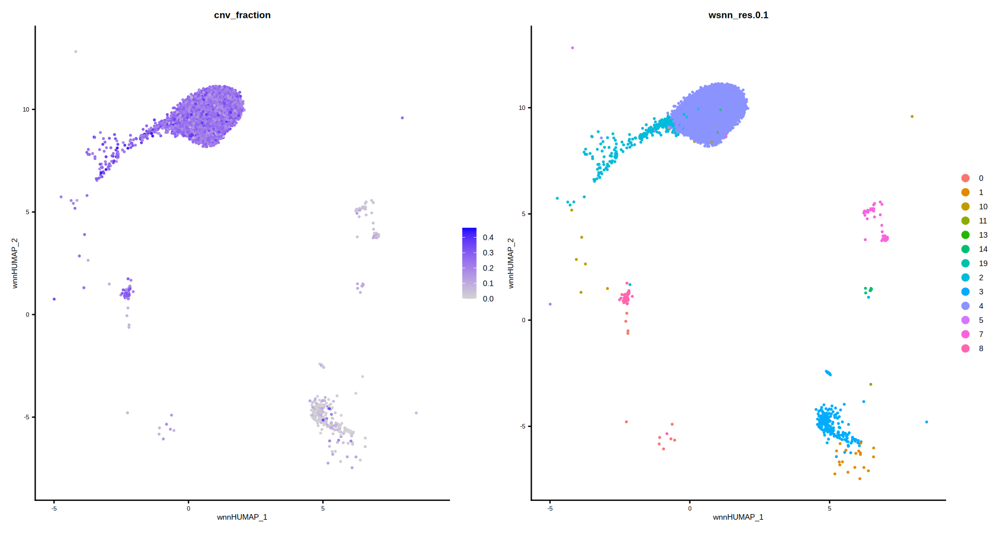

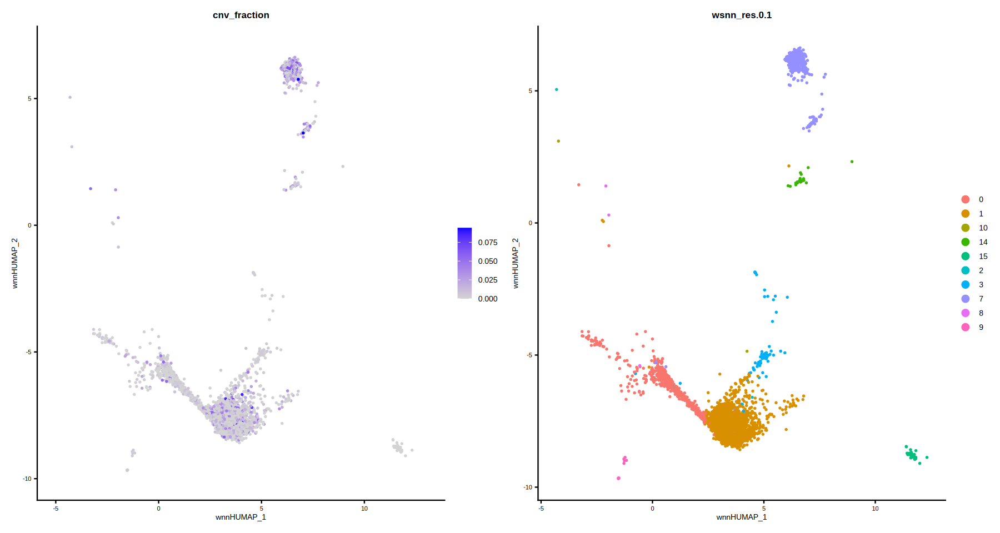

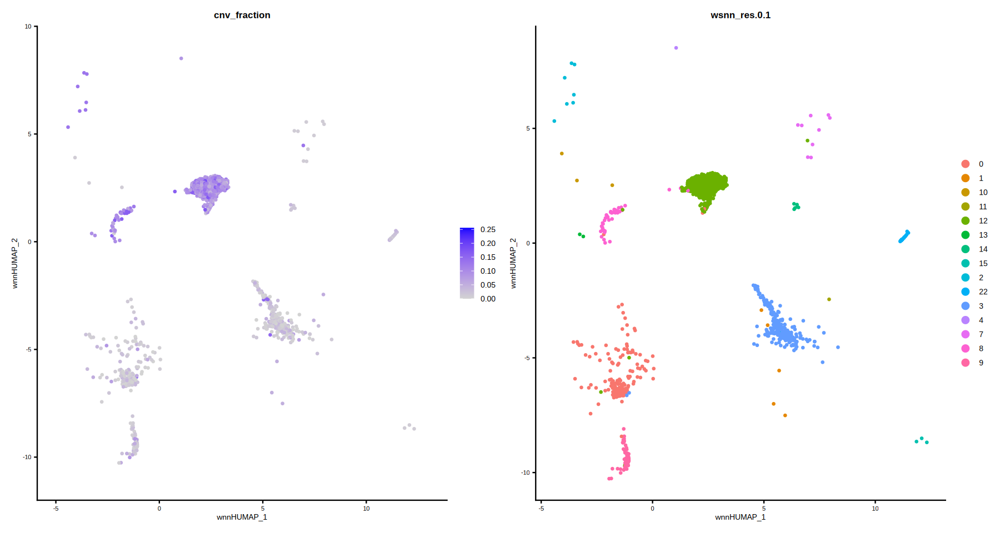

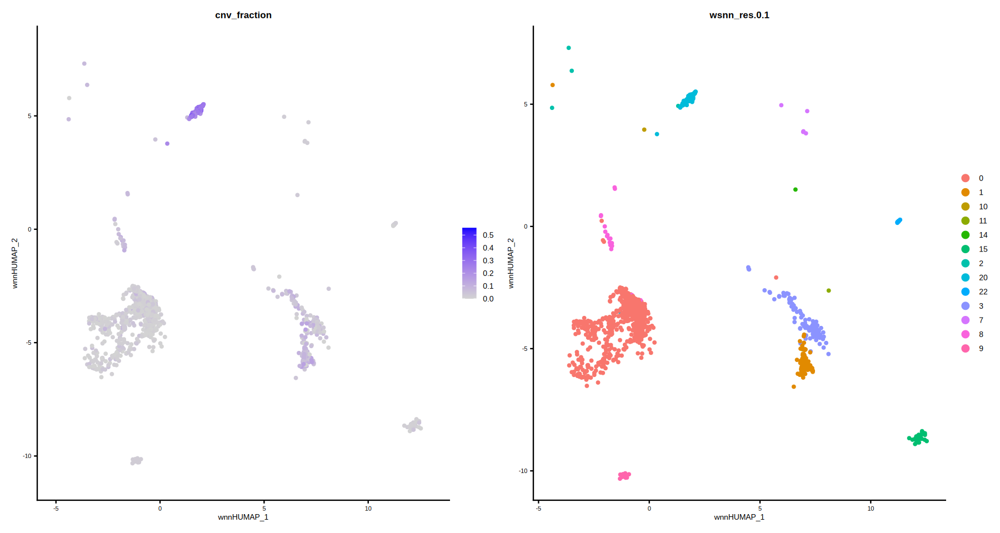

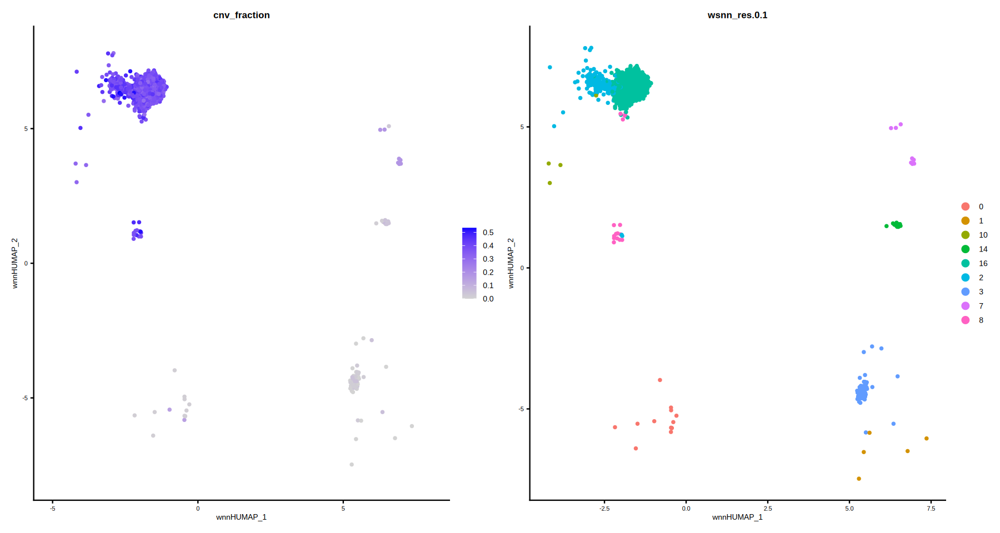

$ML080M1_Ty1

$ML1199M1_Ty1

$ML1199M1_Ty2

$ML1232M1_Ty1

$ML1239M1_Tf1

$ML123M1_Ty1

$ML1254M1_Ty1

$ML1294M1_Ty1

$ML1329M1_S1

$ML1332M1_Ty1

$ML139M1_Tf1

$ML1511M1_S1

$ML1525M1_Ty1

$ML1526M1_Ta1

$ML1646M1_S1

$ML1652M1_Ty1

$ML1704M1_Ty1

$ML1984M1_Ty1

$ML225M1_Ty1

$ML2356M1_S1

$ML499M1_S1


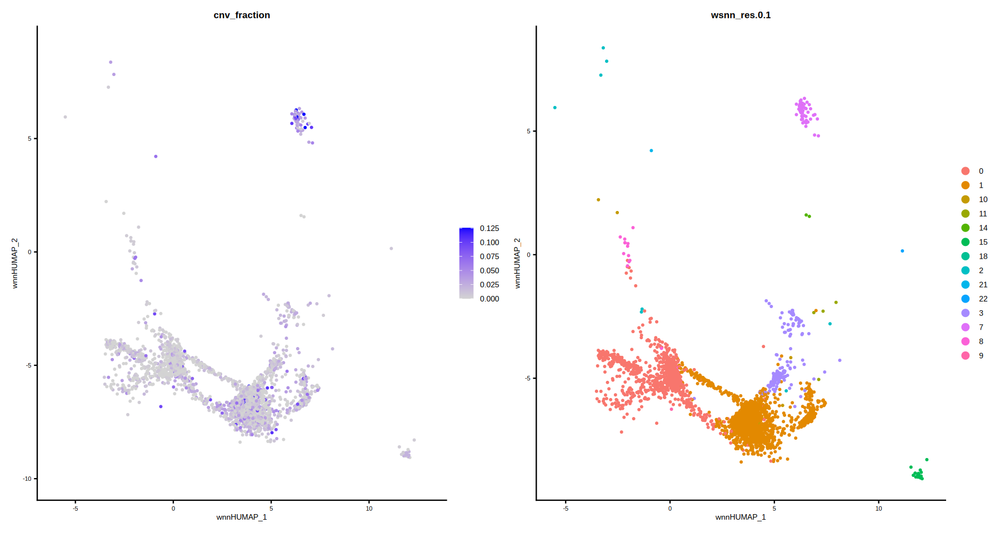

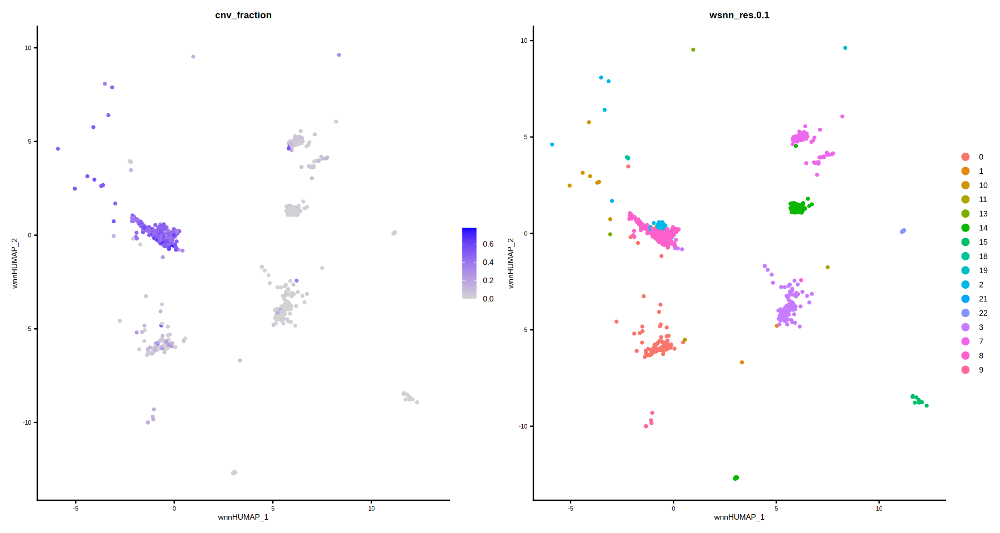

In [15]:
options(repr.plot.width = 15, repr.plot.height = 8)
common_theme <- theme(
  plot.title = element_text(size = 10),
  legend.text = element_text(size = 8),
  legend.title = element_text(size = 8),
  axis.title = element_text(size = 8),
  axis.text = element_text(size = 6)
)
mapply(function(obj) {
  FeaturePlot(obj, features = "cnv_fraction", reduction = "wnn.umap" ) & common_theme |
  DimPlot(obj, reduction = "wnn.umap", group.by =  "wsnn_res.0.1") & common_theme
}, obj.list, SIMPLIFY = FALSE)

In [19]:
mapply(function(obj, name) {

  safe_name <- gsub("[^A-Za-z0-9_]", "_", name)

  p <- FeaturePlot(
    obj, 
    features = "cnv_fraction", 
    reduction = "wnn.umap",
    min.cutoff = "q10",
    max.cutoff = "q90"
  ) & common_theme |
  DimPlot(
    obj, 
    reduction = "wnn.umap", 
    group.by = "wsnn_res.0.1"
  ) & common_theme

  p <- p + plot_annotation(title = name)

  ggsave(
    filename = paste0(safe_name, "CNV_UMAP.pdf"),
    plot = p,
    width = 10,
    height = 5
  )

}, obj.list, names(obj.list), SIMPLIFY = FALSE)

$ML080M1_Ty1
[1] "ML080M1_Ty1CNV_UMAP.pdf"

$ML1199M1_Ty1
[1] "ML1199M1_Ty1CNV_UMAP.pdf"

$ML1199M1_Ty2
[1] "ML1199M1_Ty2CNV_UMAP.pdf"

$ML1232M1_Ty1
[1] "ML1232M1_Ty1CNV_UMAP.pdf"

$ML1239M1_Tf1
[1] "ML1239M1_Tf1CNV_UMAP.pdf"

$ML123M1_Ty1
[1] "ML123M1_Ty1CNV_UMAP.pdf"

$ML1254M1_Ty1
[1] "ML1254M1_Ty1CNV_UMAP.pdf"

$ML1294M1_Ty1
[1] "ML1294M1_Ty1CNV_UMAP.pdf"

$ML1329M1_S1
[1] "ML1329M1_S1CNV_UMAP.pdf"

$ML1332M1_Ty1
[1] "ML1332M1_Ty1CNV_UMAP.pdf"

$ML139M1_Tf1
[1] "ML139M1_Tf1CNV_UMAP.pdf"

$ML1511M1_S1
[1] "ML1511M1_S1CNV_UMAP.pdf"

$ML1525M1_Ty1
[1] "ML1525M1_Ty1CNV_UMAP.pdf"

$ML1526M1_Ta1
[1] "ML1526M1_Ta1CNV_UMAP.pdf"

$ML1646M1_S1
[1] "ML1646M1_S1CNV_UMAP.pdf"

$ML1652M1_Ty1
[1] "ML1652M1_Ty1CNV_UMAP.pdf"

$ML1704M1_Ty1
[1] "ML1704M1_Ty1CNV_UMAP.pdf"

$ML1984M1_Ty1
[1] "ML1984M1_Ty1CNV_UMAP.pdf"

$ML225M1_Ty1
[1] "ML225M1_Ty1CNV_UMAP.pdf"

$ML2356M1_S1
[1] "ML2356M1_S1CNV_UMAP.pdf"

$ML499M1_S1
[1] "ML499M1_S1CNV_UMAP.pdf"

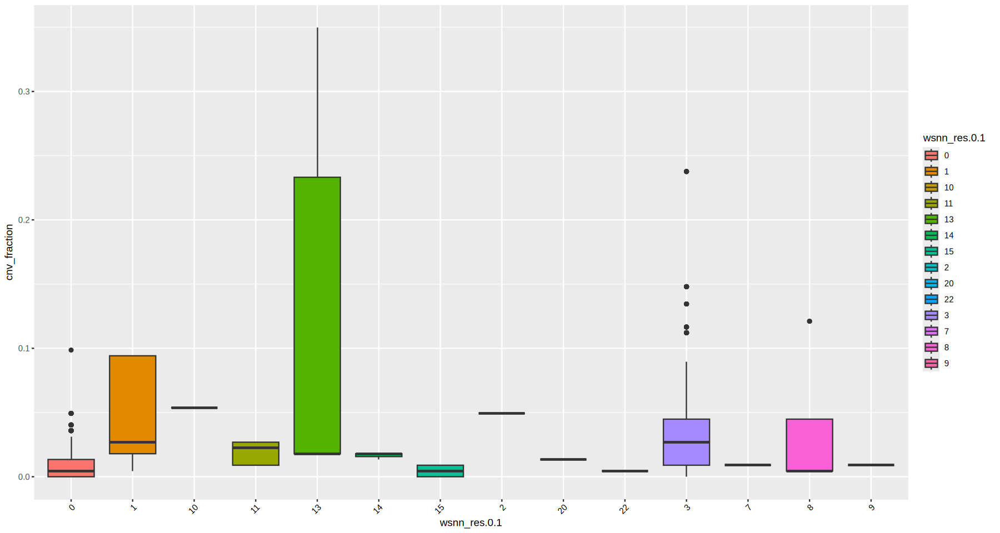

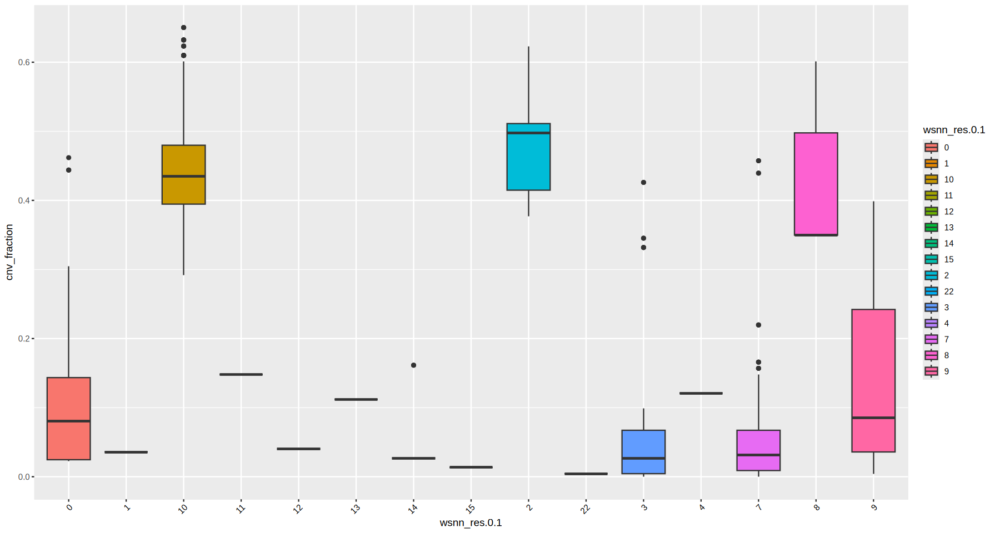

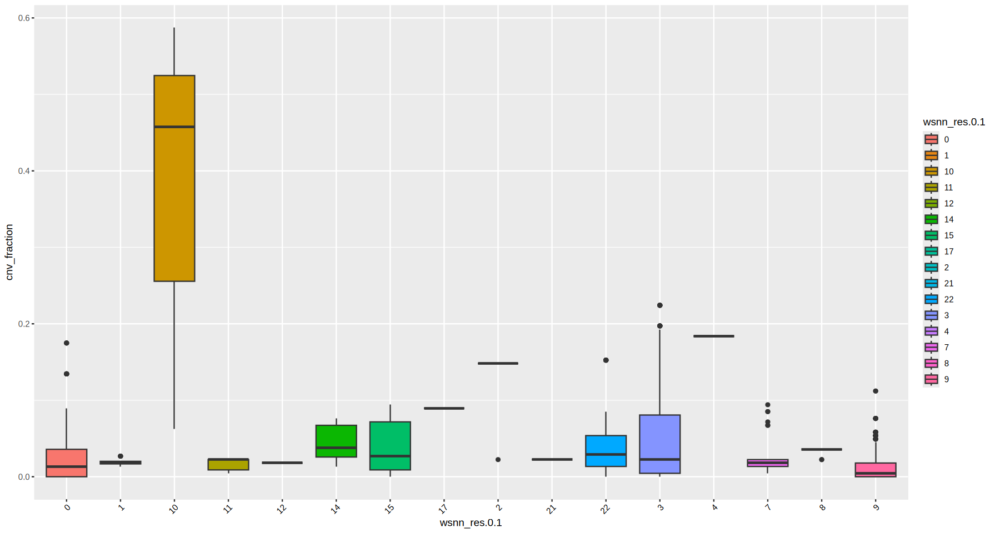

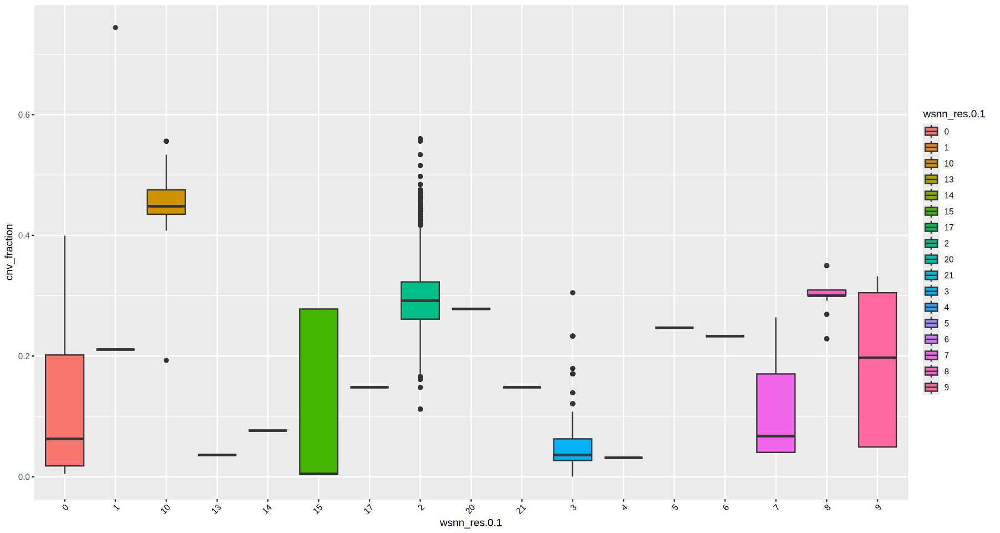

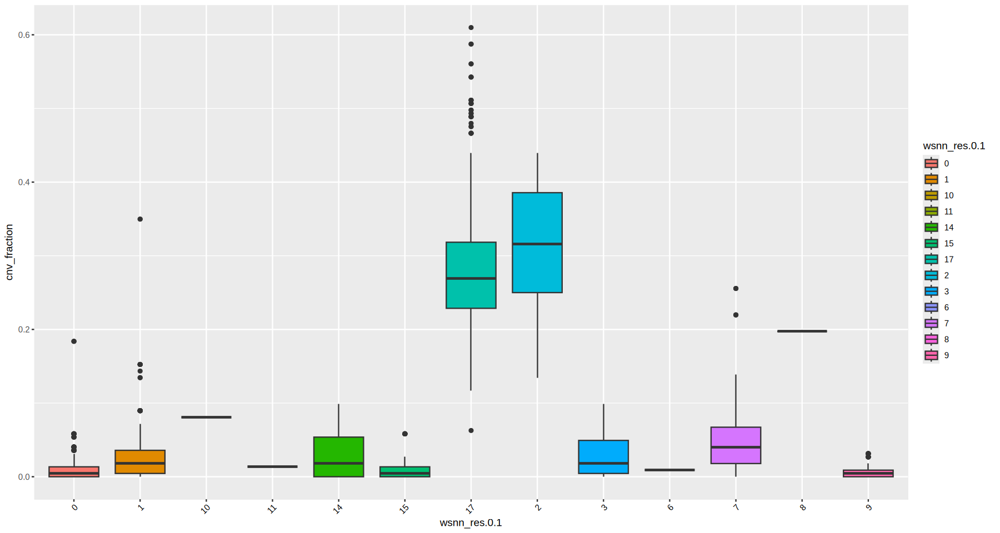

...

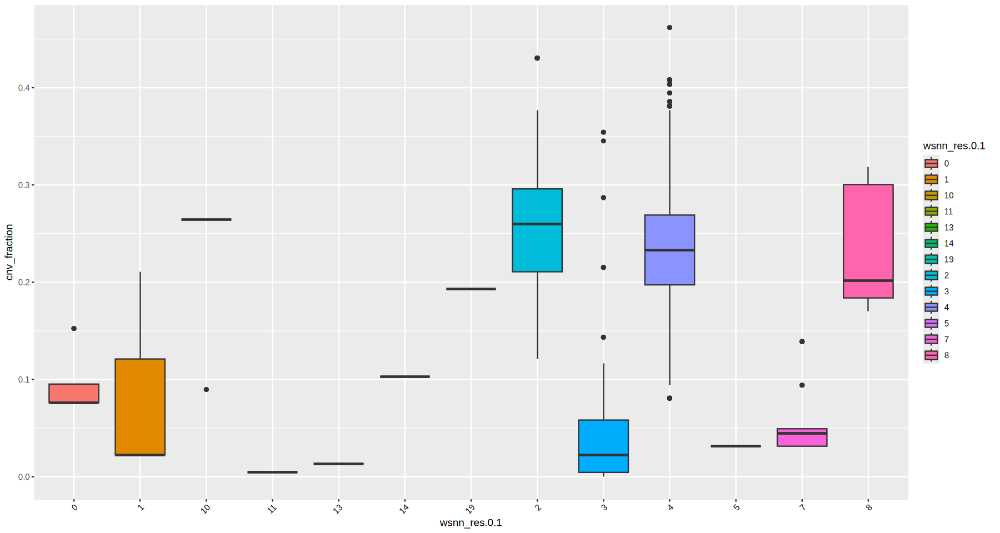

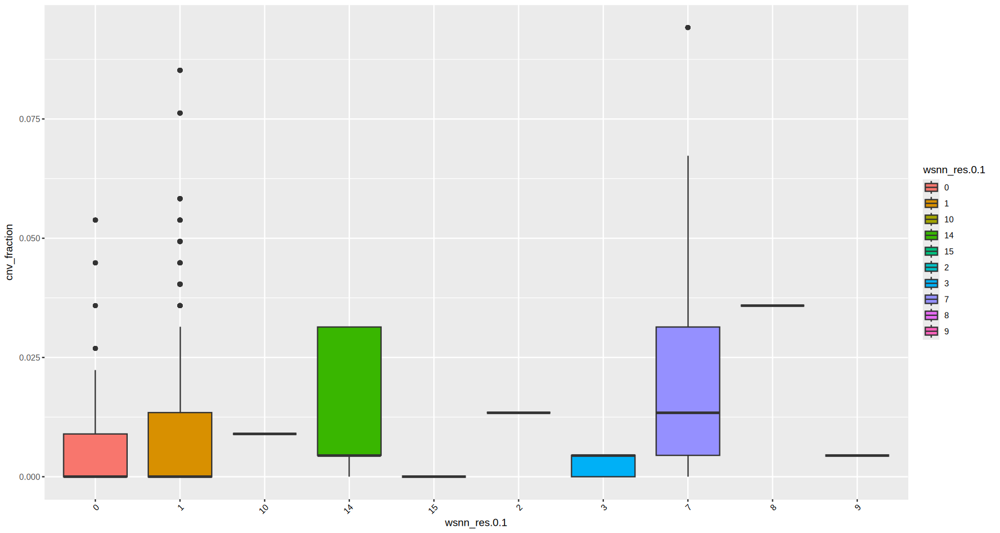

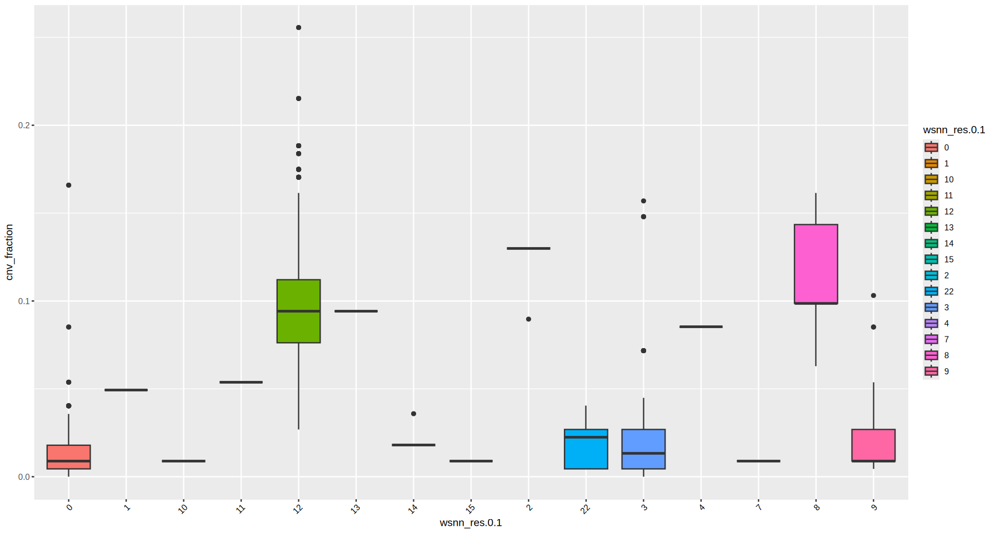

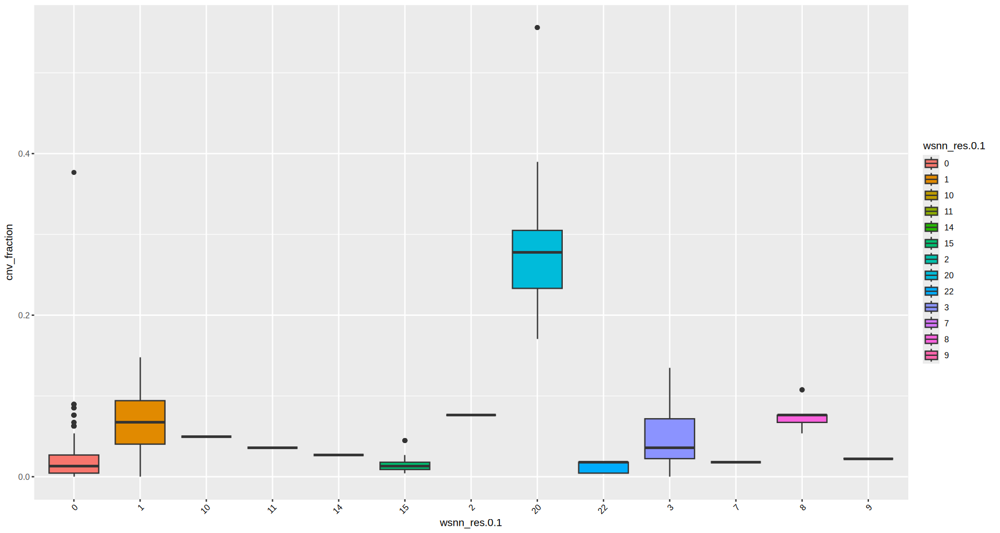

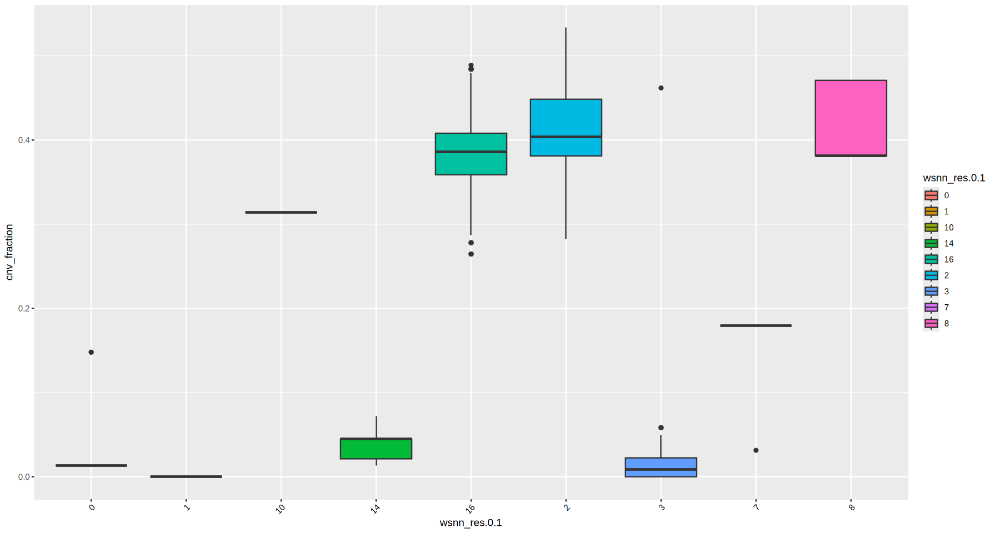

$ML080M1_Ty1

$ML1199M1_Ty1

$ML1199M1_Ty2

$ML1232M1_Ty1

$ML1239M1_Tf1

$ML123M1_Ty1

$ML1254M1_Ty1

$ML1294M1_Ty1

$ML1329M1_S1

$ML1332M1_Ty1

$ML139M1_Tf1

$ML1511M1_S1

$ML1525M1_Ty1

$ML1526M1_Ta1

$ML1646M1_S1

$ML1652M1_Ty1

$ML1704M1_Ty1

$ML1984M1_Ty1

$ML225M1_Ty1

$ML2356M1_S1

$ML499M1_S1


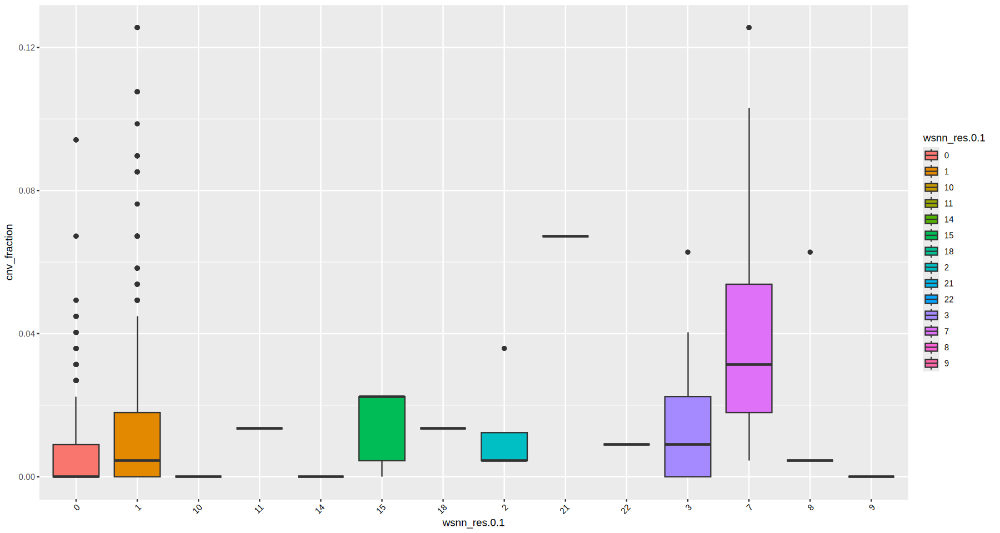

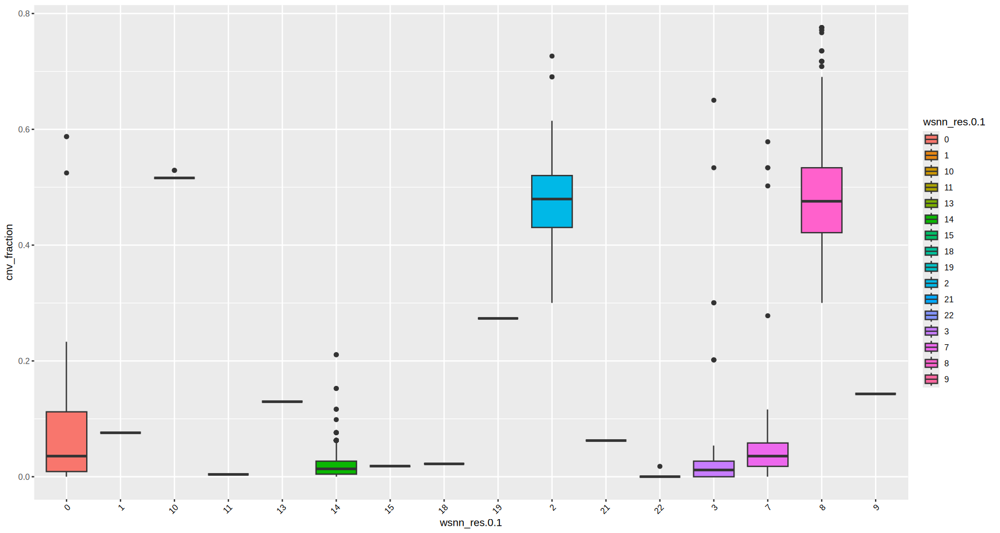

In [17]:
mapply(function(obj) {
ggplot(FetchData(obj, vars = c("wsnn_res.0.1", "cnv_fraction")), 
       aes(wsnn_res.0.1, cnv_fraction, fill = wsnn_res.0.1)) +
  geom_boxplot() +
  theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust = 1, color = "black"))
}, obj.list, SIMPLIFY = FALSE)

In [18]:
mapply(function(obj, name) {

  p <- ggplot(
    FetchData(obj, vars = c("wsnn_res.0.1", "cnv_fraction")), 
    aes(factor(wsnn_res.0.1), cnv_fraction, fill = wsnn_res.0.1)
  ) +
    geom_boxplot() +
    ggtitle(name) +
    theme(
      axis.text.x = element_text(angle = 45, hjust = 1),
      legend.position = "none"
    )

  ggsave(
    filename = paste0(name, "CNV_boxplot.pdf"),
    plot = p,
    width = 6,
    height = 4
  )

}, obj.list, names(obj.list), SIMPLIFY = FALSE)

$ML080M1_Ty1
[1] "ML080M1_Ty1CNV_boxplot.pdf"

$ML1199M1_Ty1
[1] "ML1199M1_Ty1CNV_boxplot.pdf"

$ML1199M1_Ty2
[1] "ML1199M1_Ty2CNV_boxplot.pdf"

$ML1232M1_Ty1
[1] "ML1232M1_Ty1CNV_boxplot.pdf"

$ML1239M1_Tf1
[1] "ML1239M1_Tf1CNV_boxplot.pdf"

$ML123M1_Ty1
[1] "ML123M1_Ty1CNV_boxplot.pdf"

$ML1254M1_Ty1
[1] "ML1254M1_Ty1CNV_boxplot.pdf"

$ML1294M1_Ty1
[1] "ML1294M1_Ty1CNV_boxplot.pdf"

$ML1329M1_S1
[1] "ML1329M1_S1CNV_boxplot.pdf"

$ML1332M1_Ty1
[1] "ML1332M1_Ty1CNV_boxplot.pdf"

$ML139M1_Tf1
[1] "ML139M1_Tf1CNV_boxplot.pdf"

$ML1511M1_S1
[1] "ML1511M1_S1CNV_boxplot.pdf"

$ML1525M1_Ty1
[1] "ML1525M1_Ty1CNV_boxplot.pdf"

$ML1526M1_Ta1
[1] "ML1526M1_Ta1CNV_boxplot.pdf"

$ML1646M1_S1
[1] "ML1646M1_S1CNV_boxplot.pdf"

$ML1652M1_Ty1
[1] "ML1652M1_Ty1CNV_boxplot.pdf"

$ML1704M1_Ty1
[1] "ML1704M1_Ty1CNV_boxplot.pdf"

$ML1984M1_Ty1
[1] "ML1984M1_Ty1CNV_boxplot.pdf"

$ML225M1_Ty1
[1] "ML225M1_Ty1CNV_boxplot.pdf"

$ML2356M1_S1
[1] "ML2356M1_S1CNV_boxplot.pdf"

$ML499M1_S1
[1] "ML499M1_S1CNV_boxplot.pdf"

### 提取正常细胞，细胞注释

In [20]:
sub.SKCM <- subset(SKCM, idents = c(0, 1, 3, 7, 9, 11, 14, 15, 18 ,22 ))

In [21]:
DefaultAssay(sub.SKCM) <- "RNA"
sub.SKCM <- SCTransform(sub.SKCM,vars.to.regress = c("nCount_RNA", 
                                                 "percent.mt"), return.only.var.genes = F)
sub.SKCM <- RunPCA(sub.SKCM)

Running SCTransform on assay: RNA

Warning message:
"The `slot` argument of `GetAssayData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead.
ℹ The deprecated feature was likely used in the Seurat package.
  Please report the issue at <https://github.com/satijalab/seurat/issues>."
vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 15575 by 1453

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 1453 cells

Found 25 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 15575 genes

Computing corrected count matrix for 15575 genes

Calculating gene attributes

Wall clock passed: Time difference of 16.72518 secs

Determine variable features

Regressing out nCount_RNA, percent.mt

Centering da

In [23]:
DefaultAssay(sub.SKCM) <- "peaks"
sub.SKCM <- FindTopFeatures(sub.SKCM, min.cutoff = 5)
sub.SKCM <- RunTFIDF(sub.SKCM)
sub.SKCM <- RunSVD(sub.SKCM)

Performing TF-IDF normalization

Warning message in RunTFIDF.default(object = GetAssayData(object = object, layer = "counts"), :
"Some features contain 0 total counts"
Running SVD

Scaling cell embeddings



In [24]:
library(harmony)
DefaultAssay(sub.SKCM) <- "RNA"
sub.SKCM<-RunHarmony(sub.SKCM,
                   group.by.vars="sample",
                   reduction.use = 'pca',
                   reduction.save = "harmony1",
) 

# 使用 peaks assay，基于 LSI 空间对 ATAC 数据做批次校正
DefaultAssay(sub.SKCM) <- "peaks"
sub.SKCM<-RunHarmony(sub.SKCM,
                   group.by.vars="sample",
                   reduction.use = 'lsi',
                   reduction.save = "harmony2",
                   project.dim = FALSE
) 

# 使用 Harmony 处理后的 RNA (harmony1) 和 ATAC (harmony2) 降维结果构建多模态邻接图
sub.SKCM <- FindMultiModalNeighbors(
  object = sub.SKCM,
  reduction.list = list("harmony1", "harmony2"), 
  dims.list = list(1:30, 2:30),
  modality.weight.name = "RNA.weight",
  verbose = TRUE
)

Loading required package: Rcpp

Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony converged after 6 iterations

Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony 7/10

Harmony 8/10

Harmony converged after 8 iterations

Calculating cell-specific modality weights

Finding 20 nearest neighbors for each modality.

Calculating kernel bandwidths

Warning message in FindMultiModalNeighbors(object = sub.SKCM, reduction.list = list("harmony1", :
"The number of provided modality.weight.name is not equal to the number of modalities. SCT.weight peaks.weight are used to store the modality weights"
Finding multimodal neighbors

Constructing multimodal KNN graph

Constructing multimodal SNN graph



In [25]:
sub.SKCM <- RunUMAP(
  object = sub.SKCM,
  nn.name = "weighted.nn",
    reduction.name = "wnn.harmony.umap", # 起了个新名字
  reduction.key = "wnnHUMAP_",
  verbose = TRUE
)
sub.SKCM<- FindClusters(
  sub.SKCM, 
  graph.name = "wsnn", # wsnn 是 FindMultiModalNeighbors 默认生成的联合图名称
  algorithm = 3,       # 匹配文献：3 代表 SLM 算法, algorithm = 4 是 Leiden。
  resolution = 0.5,
  verbose = FALSE
)

12:48:05 UMAP embedding parameters a = 0.9922 b = 1.112

12:48:10 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 20

12:48:15 Initializing from normalized Laplacian + noise (using RSpectra)

12:48:16 Commencing optimization for 200 epochs, with 1294126 positive edges

12:48:16 Using rng type: pcg

12:48:47 Optimization finished

Warning message:
"Key 'wnnHUMAP_' taken, using 'wnnharmonyumap_' instead"


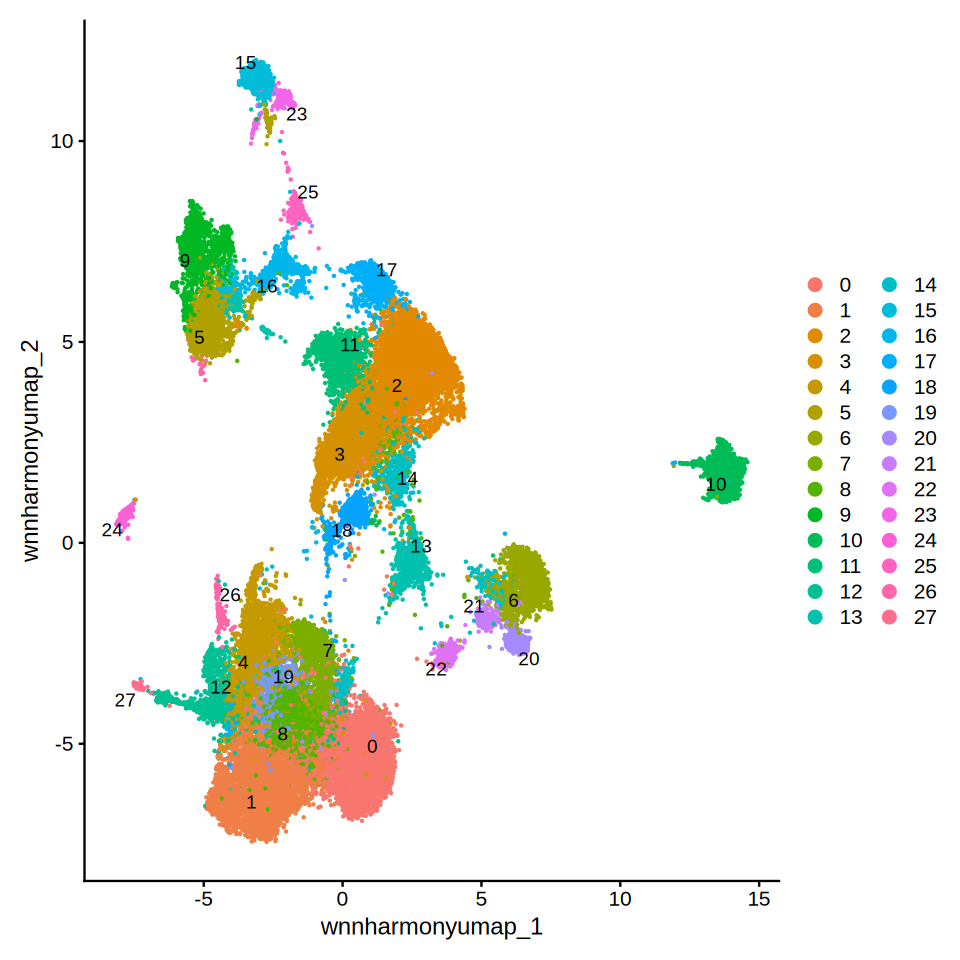

In [26]:
options(repr.plot.width = 8, repr.plot.height = 8)
DimPlot(sub.SKCM, label = TRUE, repel = TRUE, reduction = "wnn.harmony.umap")

Warning message:
"Could not find IL4 in the default search locations, found in 'RNA' assay instead"
Warning message:
"No layers found matching search pattern provided"
Warning message in FetchData.Assay5(object = object[[assay]], vars = keyed.var, :
"data layer is not found and counts layer is used"
Warning message:
"Could not find MRGPRX2 in the default search locations, found in 'RNA' assay instead"
Warning message:
"No layers found matching search pattern provided"
Warning message in FetchData.Assay5(object = object[[assay]], vars = keyed.var, :
"data layer is not found and counts layer is used"
Warning message:
"Could not find TPSD1 in the default search locations, found in 'RNA' assay instead"
Warning message:
"No layers found matching search pattern provided"
Warning message in FetchData.Assay5(object = object[[assay]], vars = keyed.var, :
"data layer is not found and counts layer is used"
Warning message:
"Could not find TPSAB1 in the default search locations, found in 'RNA' ass

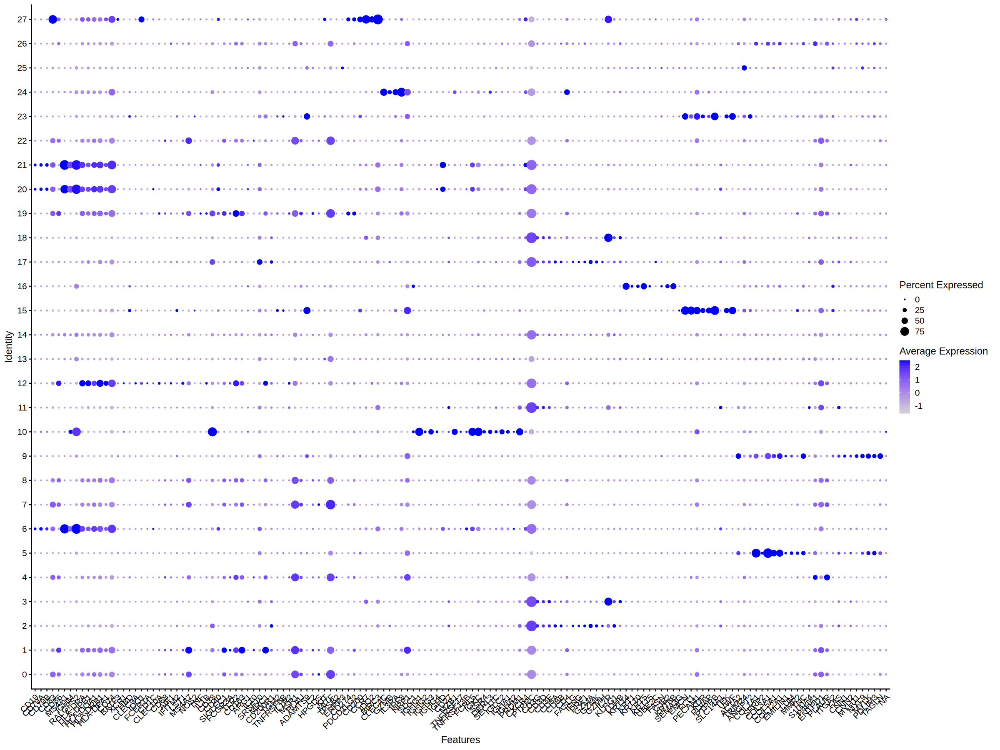

In [50]:
options(repr.plot.width = 20, repr.plot.height = 15)
DefaultAssay(sub.SKCM) <- "SCT"
DotPlot(sub.SKCM, features = SKCM_marker) + RotatedAxis() 

In [68]:
new_labels <- c("Macrophages","Macrophages","T cells","T cells","Macrophages","Fibroblasts","B-cells","Macrophages","Macrophages","vSMCs","Plasma cells","T cells","Other","Unknown","Unknown","Endothelial","Keratinocytes","T cells","T cells",
                "Macrophages","B-cells","B-cells","Unknown","Endothelial","DC","Unknown","Unknown","DC")
names(new_labels) <- as.character(c(0:27))  # 对应 cluster

# 在 Seurat 对象里创建一个新列
sub.SKCM$celltype <- plyr::mapvalues(
  x = sub.SKCM$wsnn_res.0.5,
  from = names(new_labels),
  to = new_labels
)

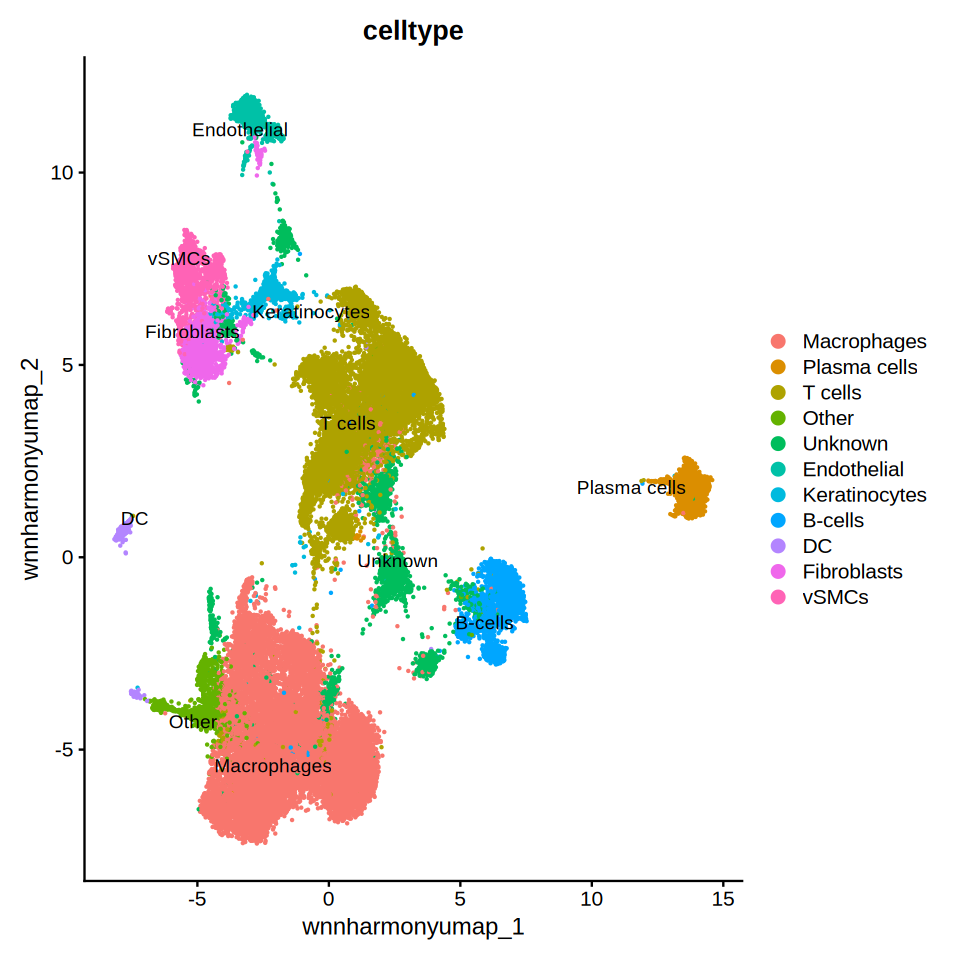

In [70]:
options(repr.plot.width = 8, repr.plot.height = 8)
DimPlot(sub.SKCM, group.by = "celltype",label = TRUE, repel = TRUE, reduction = "wnn.harmony.umap")

### 映射回原数据

In [72]:
cell_type_df <- data.frame(
  barcode = colnames(sub.SKCM),
  celltype = as.character(sub.SKCM$celltype)
)
head(cell_type_df)

,barcode,celltype
,<chr>,<chr>
1,ML080M1-Ty1_AAACATGCAGAGAGCC-1,T cells
2,ML080M1-Ty1_AAACATGCAGGAACAT-1,Unknown
3,ML080M1-Ty1_AAACCGCGTGTTGCAA-1,Plasma cells
4,ML080M1-Ty1_AAACGGATCCTCATGC-1,Macrophages
5,ML080M1-Ty1_AAACGTACAGCAACAG-1,Other
6,ML080M1-Ty1_AAACGTACAGTATGTT-1,T cells


In [73]:
SKCM$celltype <- "Tumor"
matched_barcodes <- intersect(colnames(SKCM), cell_type_df$barcode)
SKCM$celltype[matched_barcodes] <- cell_type_df$celltype[match(matched_barcodes, cell_type_df$barcode)]

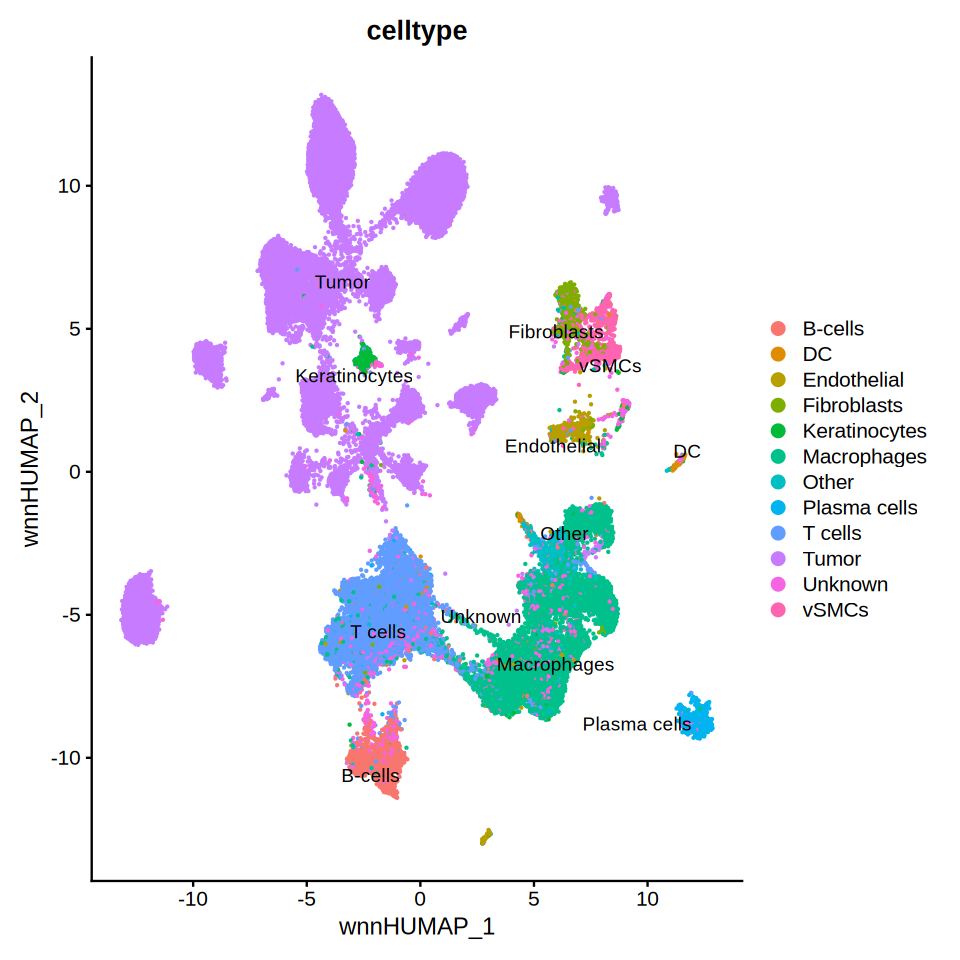

In [74]:
options(repr.plot.width = 8, repr.plot.height = 8)
DimPlot(SKCM, label = TRUE, repel = TRUE, reduction = "wnn.umap",group.by = "celltype")

In [ ]:
saveRDS(SKCM,file="/mnt/netshare2/miaoyuanyuan/work/3_Cancer/1_cancer11/3_merge_data/SKCM/SKCM_annoAll.rds")